In [1]:
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
from sklearn.metrics import mean_squared_error
from pandas import read_csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# one-step Holt Winters Exponential Smoothing forecast
def exp_smoothing_forecast(history, config): 
    t,d,s,p,b,r = config
    # define model
    history = np.array(history)
    model = ExponentialSmoothing(history, trend=t, damped=d, seasonal=s, seasonal_periods=p)
    # fit model
    model_fit = model.fit(optimized=True, use_boxcox=b, remove_bias=r)
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

# root mean squared error or rmse
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# split a univariate dataset into train/test sets
def train_test_split(data, n_test): 
    return data[:-n_test], data[-n_test:]

In [2]:
# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg): 
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test) # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set 
    for i in range(len(test)):
    # fit model and make forecast for history
        yhat = exp_smoothing_forecast(history, cfg)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
        # estimate prediction error
    error = measure_rmse(test, predictions) 
    return error

In [7]:
# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False): 
    result = None
    # convert config to a key
    key = str(cfg)
    # show all warnings and fail on exception if debugging
    if debug:
        result = walk_forward_validation(data, n_test, cfg)
    else:
        # one failure during model validation suggests an unstable config
        try:
           # never show warnings when grid searching, too noisy
           with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg)
        except:
            error = None
    # check for an interesting result
    #if result is not None:
        #print(' > Model[%s] %.3f' % (key, result))
    return (key, result)

In [8]:
# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True): 
    scores = None
    if parallel:
    # execute configs in parallel
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing') 
        tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list) 
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
     # remove empty results
    scores = [r for r in scores if r[1] != None] # sort configs by error, asc 
    scores.sort(key=lambda tup: tup[1])
    return scores

In [9]:
# create a set of exponential smoothing configs to try
def exp_smoothing_configs(seasonal=[None]): 
    models = list()
    # define config lists
    t_params = [None]
    d_params = [True, False] 
    s_params = ['add', 'mul', None] 
    p_params = seasonal
    b_params = [True, False] 
    r_params = [True, False]
    # create config instances
    for t in t_params:
        for d in d_params: 
            for s in s_params:
                for p in p_params: 
                    for b in b_params:
                        for r in r_params: 
                            cfg = [t,d,s,p,b,r] 
                            models.append(cfg)
    return models

1


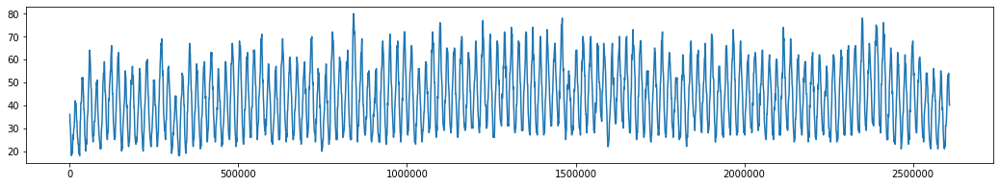

[None, False, 'add', 24, True, True] 1.1874046311732764
2


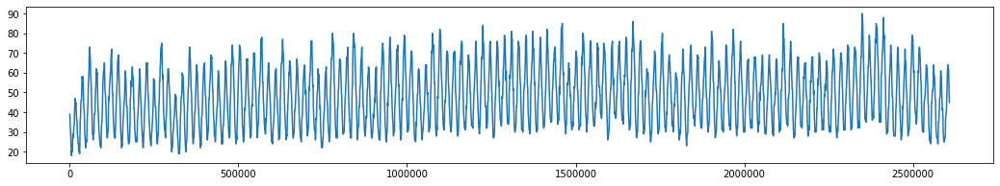

[None, False, 'add', 24, False, False] 0.8779299049946617
3


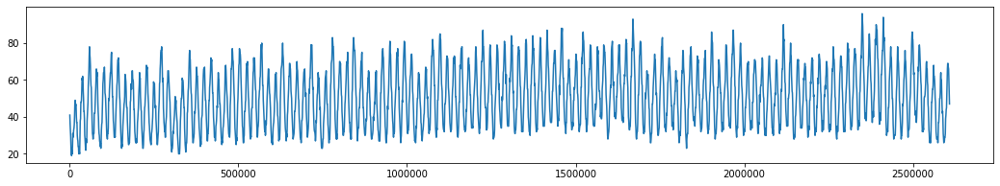

[None, False, 'add', 24, False, False] 0.9203714136398773
4


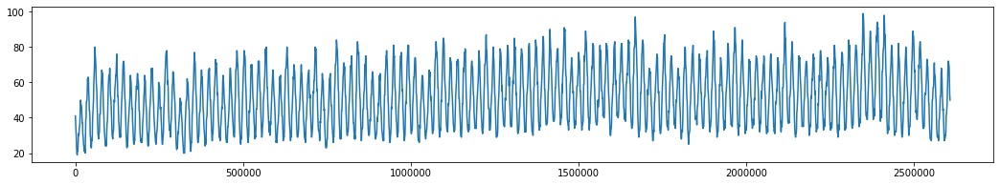

[None, False, 'add', 24, False, False] 1.6119735355897111
5


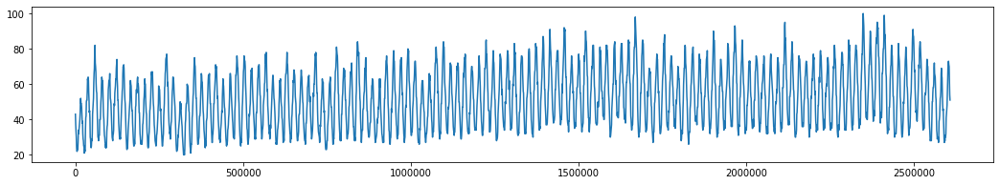

[None, False, 'add', 24, False, False] 1.6284169178871633
6


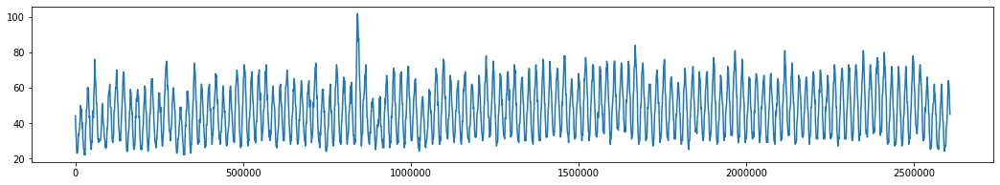

[None, False, 'add', 24, False, False] 1.3134028413658951
7


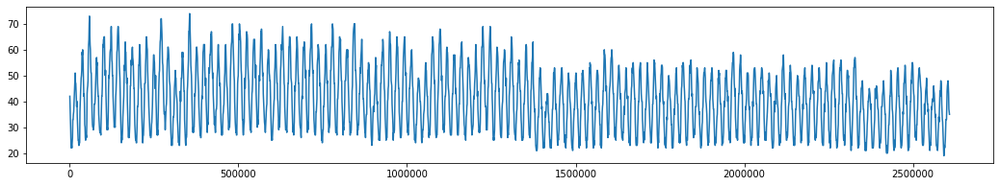

[None, False, 'add', 24, True, True] 1.402111086217446
8


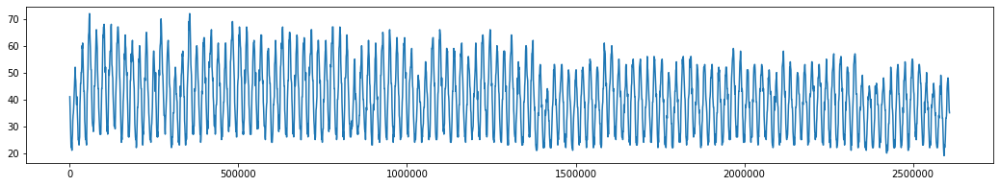

[None, False, 'add', 24, True, False] 0.8788958291609537
9


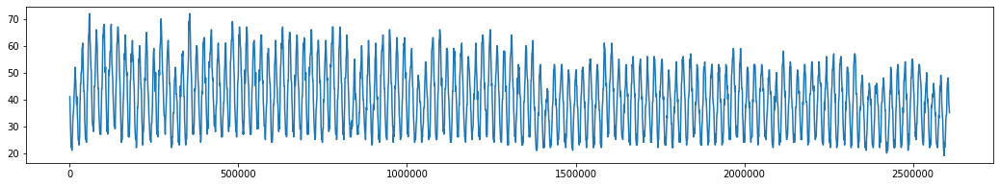

[None, False, 'add', 24, True, False] 1.0577115402118986
10


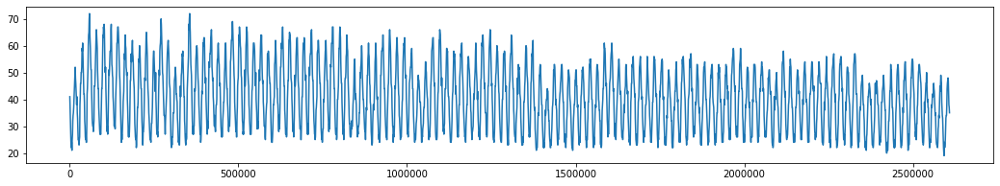

[None, False, 'add', 24, True, False] 1.0652529848289867
11


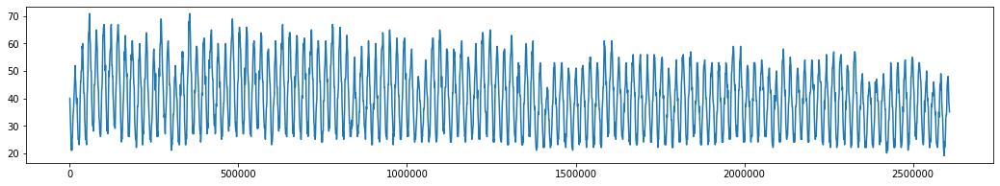

[None, False, 'add', 24, True, False] 1.077384615794877
12


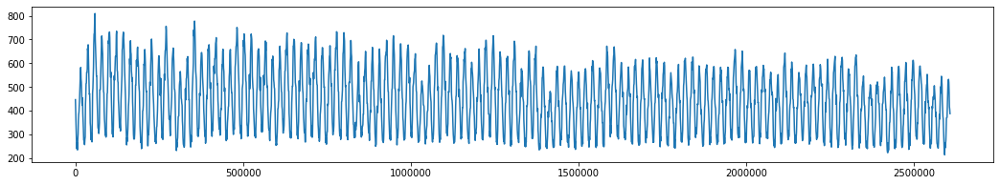

[None, False, 'add', 24, True, False] 11.817195059922595
13


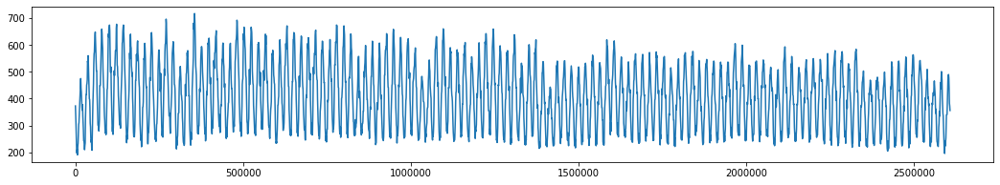

[None, False, 'add', 24, True, False] 11.0302745088118
14


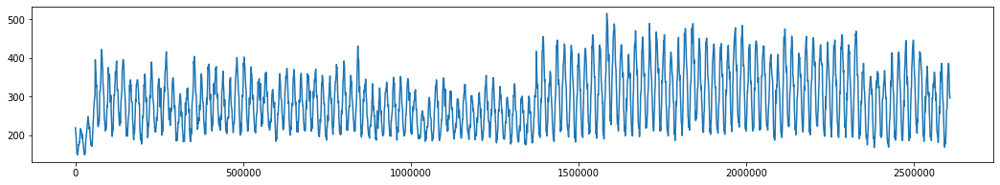

[None, False, 'add', 24, False, False] 7.591568392029829
15


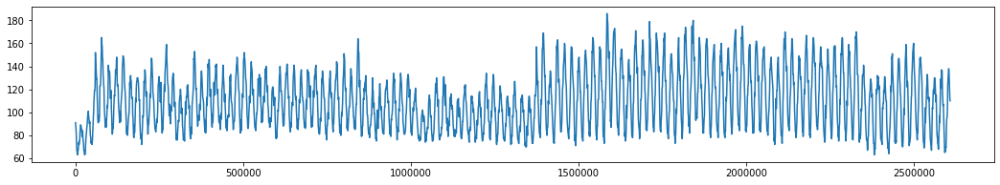

[None, False, 'add', 24, False, False] 1.9197914914430712
16


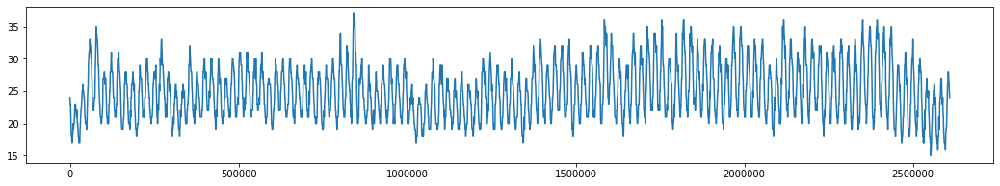

[None, False, 'add', 24, False, False] 0.5133130573224453
17


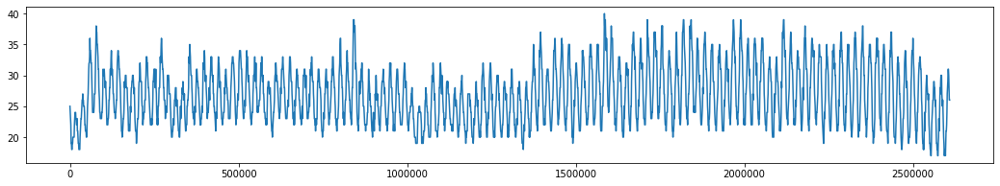

[None, False, 'add', 24, False, False] 0.6226702289416591
18


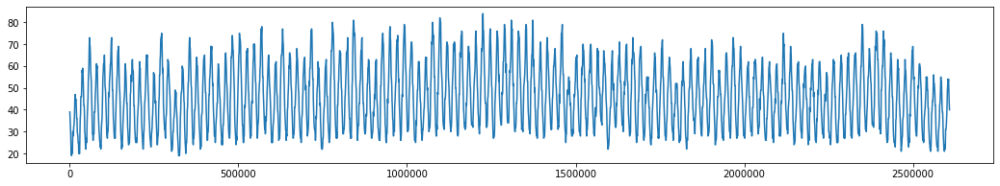

[None, False, 'add', 24, True, True] 0.5157963440992224
19


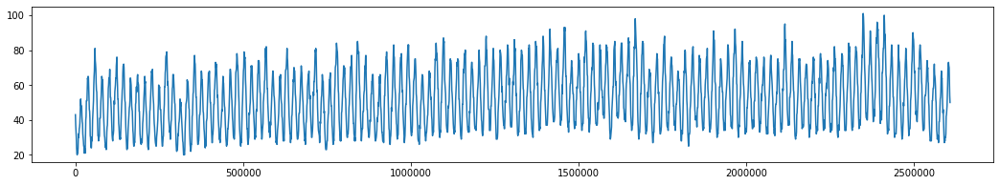

[None, False, 'add', 24, False, False] 1.2969128992241301
20


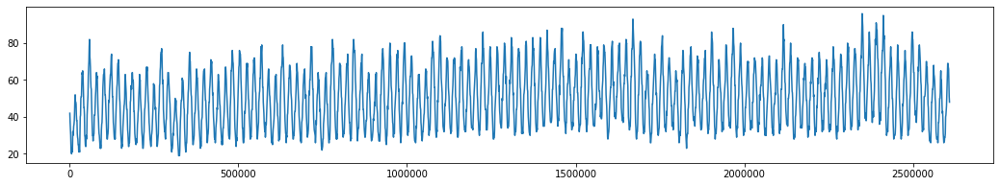

[None, False, 'add', 24, False, False] 1.4356631158809048
21


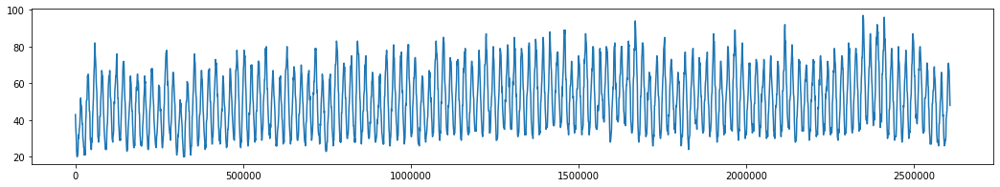

[None, False, 'add', 24, False, False] 0.8979381792504808
22


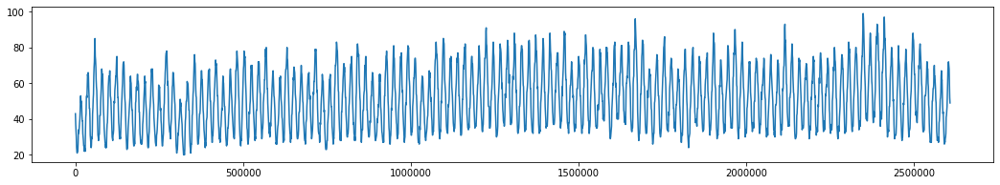

[None, False, 'add', 24, False, False] 1.6846116571096823
23


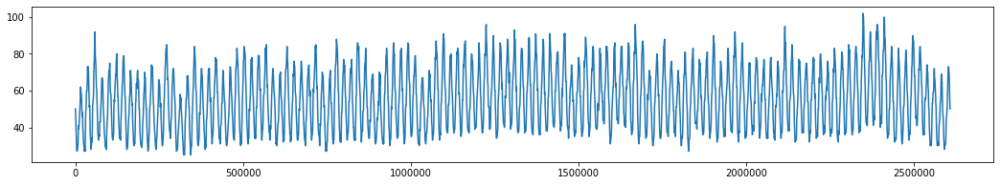

[None, False, 'add', 24, False, False] 1.1062041299702003
24


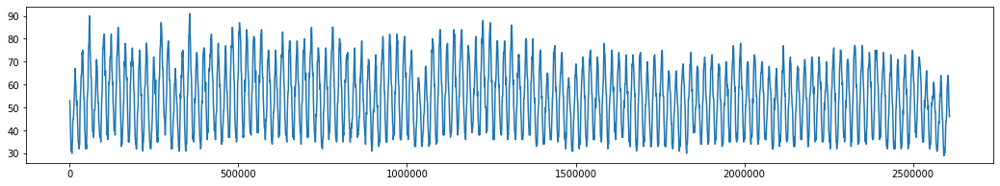

[None, False, 'add', 24, False, False] 1.1081362881404533
25


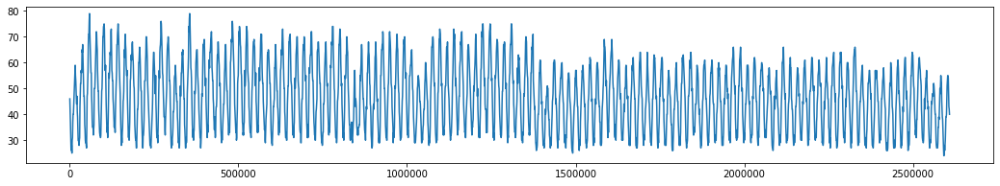

[None, False, 'add', 24, True, False] 1.4117120300058017
26


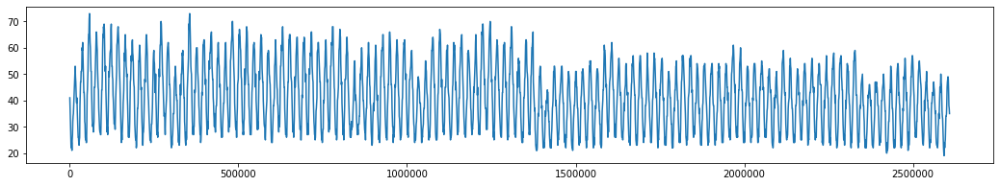

[None, False, 'add', 24, True, False] 1.1607257926906824
27


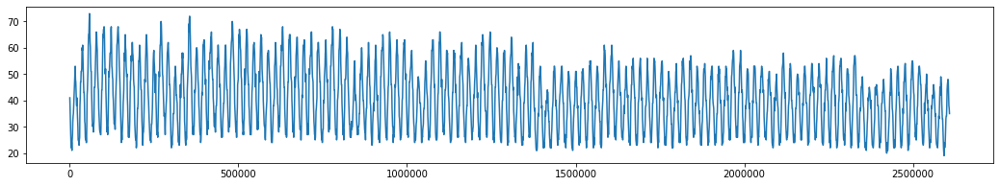

[None, False, 'add', 24, True, False] 1.0292945405281642
28


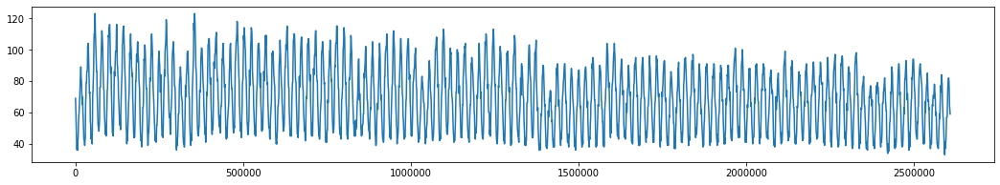

[None, False, 'add', 24, True, False] 1.7178158064046012
29


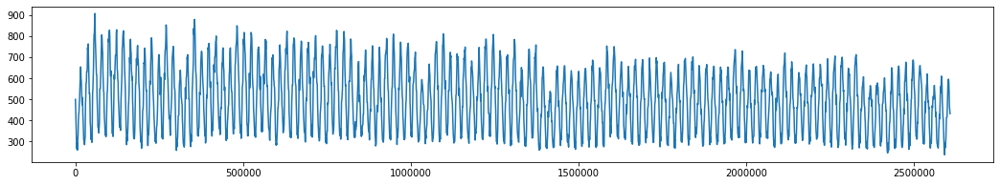

[None, False, 'add', 24, True, False] 13.33564423917228
30


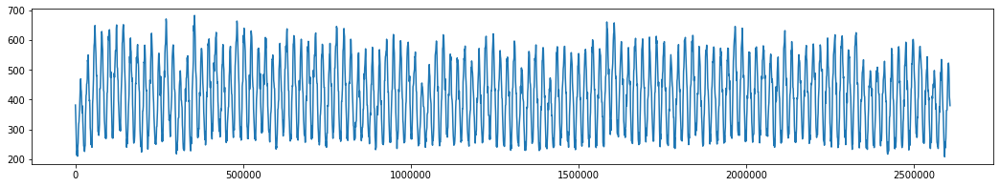

[None, False, 'add', 24, True, False] 11.806204607136403
31


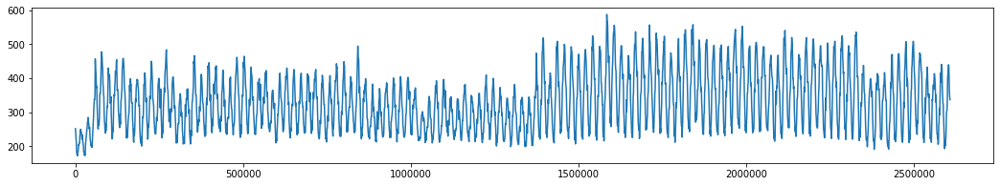

[None, False, 'add', 24, False, False] 8.90841871575716
32


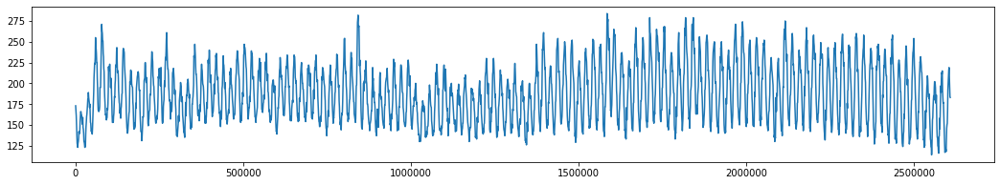

[None, False, 'add', 24, False, False] 4.305976245835093
33


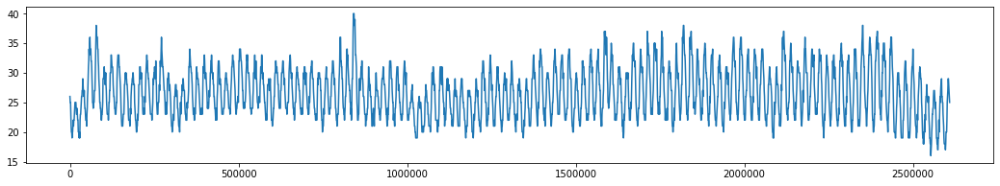

[None, False, 'add', 24, False, True] 0.548361768754408
34


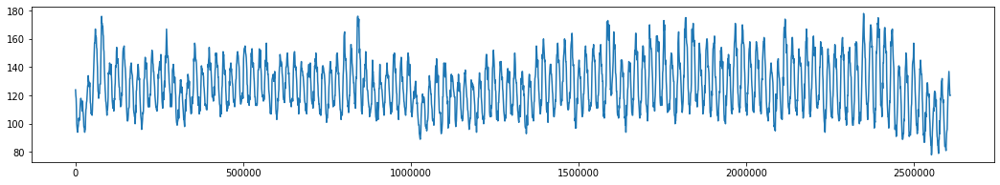

[None, False, 'add', 24, False, False] 2.6346736867653564
35


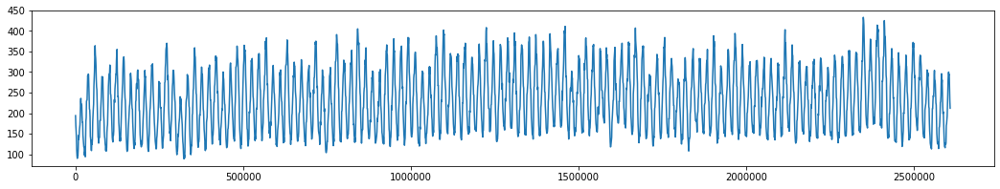

[None, False, 'add', 24, False, False] 2.7626126067556345
36


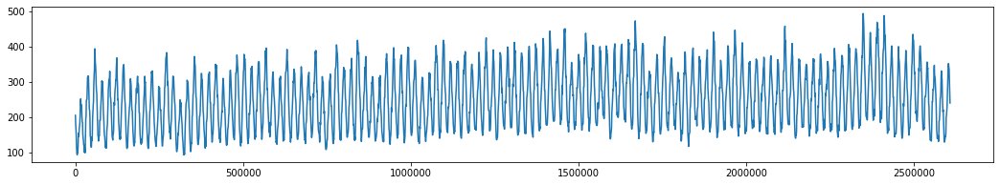

[None, False, 'add', 24, False, False] 5.856482885797221
37


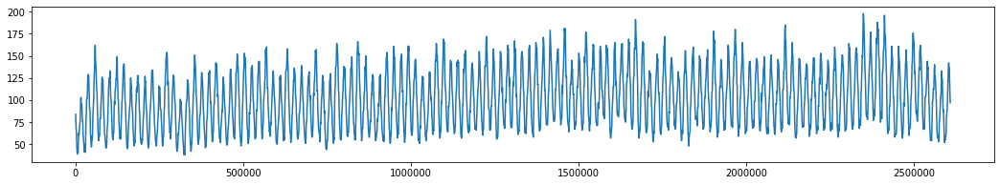

[None, False, 'add', 24, False, False] 2.0479546955773973
38


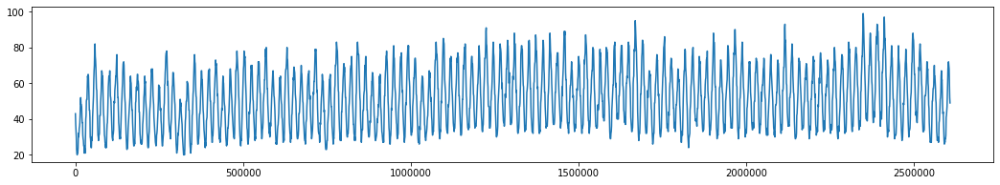

[None, False, 'add', 24, False, False] 1.5007732300885932
39


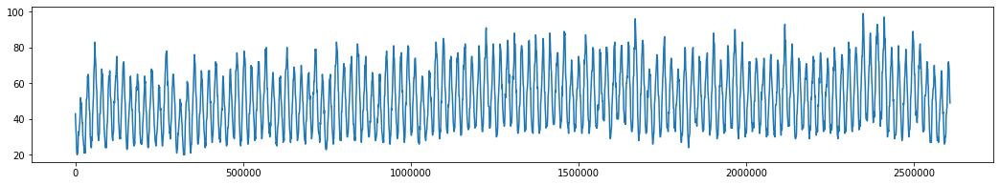

[None, False, 'add', 24, False, False] 1.2855502724116727
40


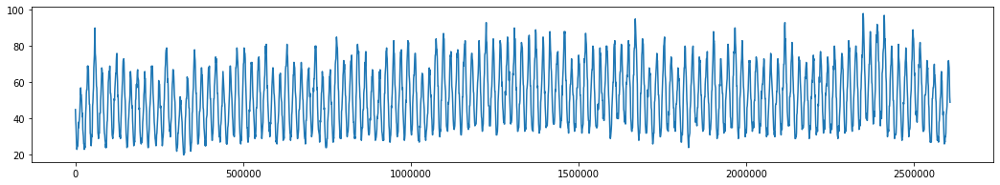

[None, False, 'add', 24, False, False] 1.7836394439173116
41


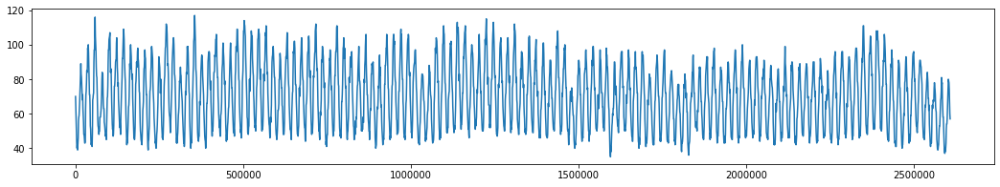

[None, False, 'add', 24, False, False] 0.8924178482216557
42


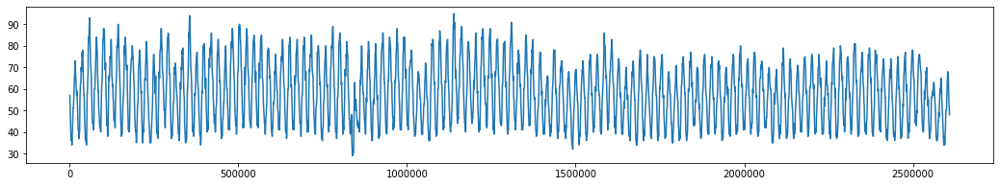

[None, False, 'add', 24, False, True] 1.0832144137533306
43


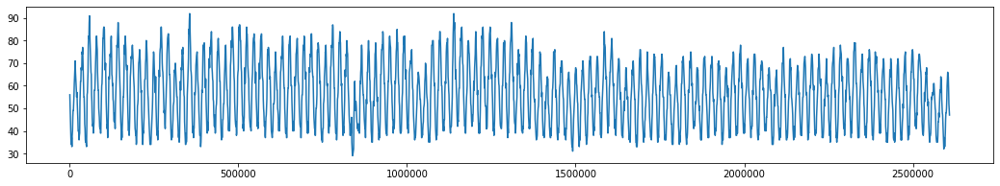

[None, False, 'add', 24, False, True] 0.7061994849365631
44


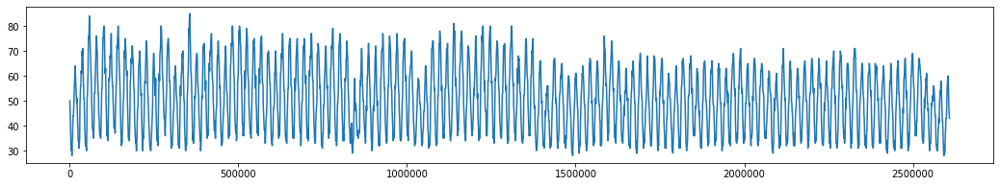

[None, False, 'add', 24, False, False] 1.0471380876351606
45


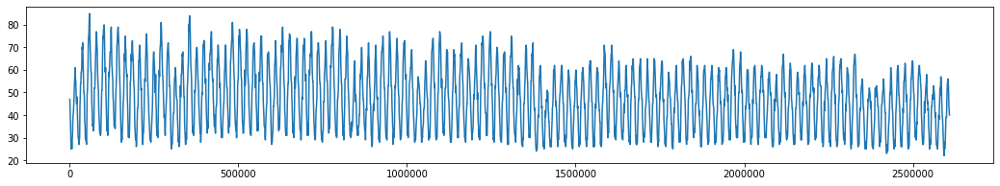

[None, False, 'add', 24, True, False] 0.8337684458280527
46


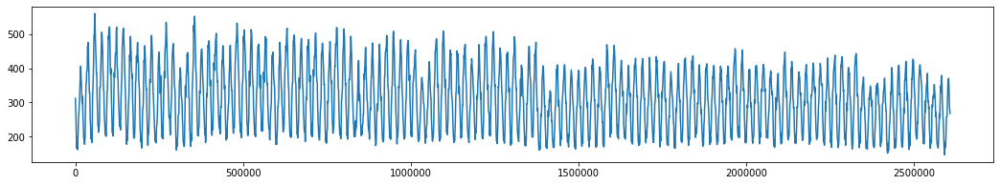

[None, False, 'add', 24, True, True] 8.861397684718103
47


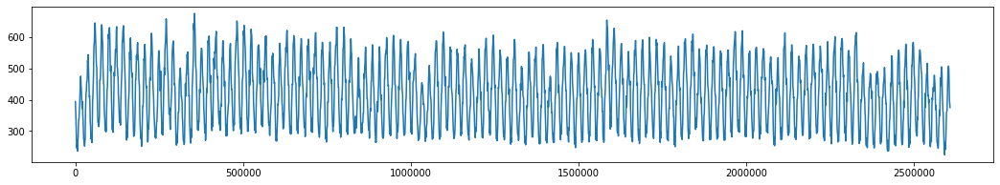

[None, False, 'add', 24, False, False] 9.134200165152299
48


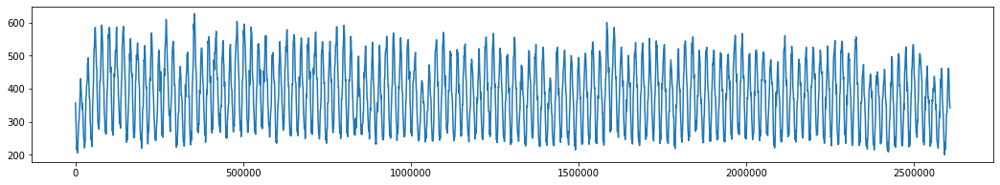

[None, False, 'add', 24, False, False] 8.852133446921563
49


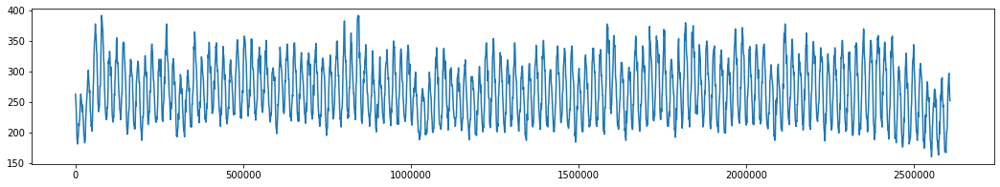

[None, False, 'add', 24, False, True] 4.987439129354003
50


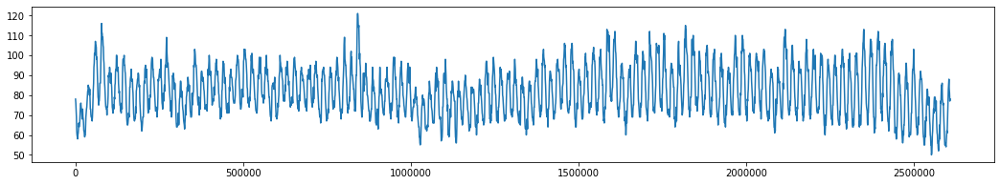

[None, False, 'mul', 24, False, False] 2.516887216809277
51


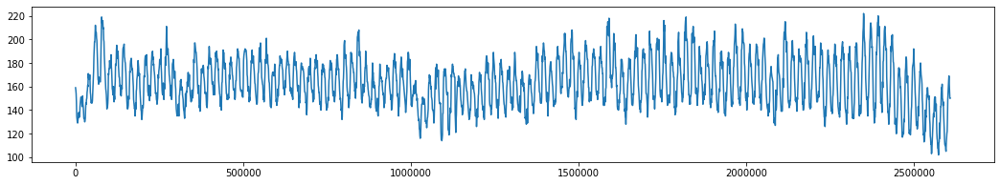

[None, False, 'add', 24, False, True] 3.7006402701493863
52


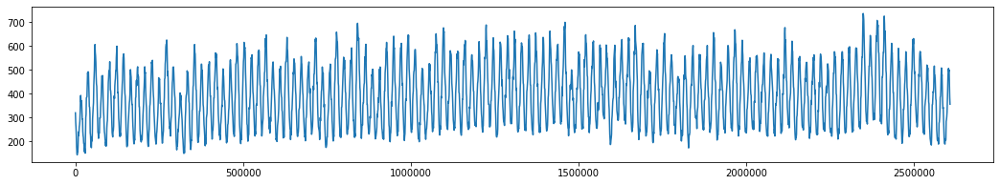

[None, False, 'add', 24, False, False] 5.156661431849516
53


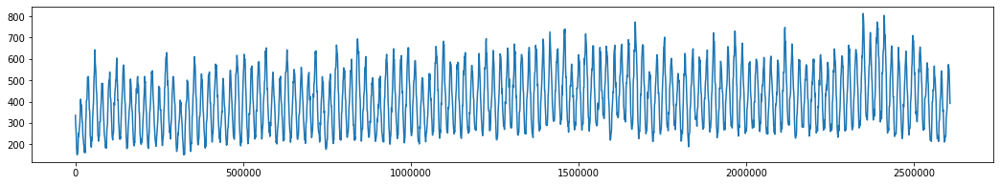

[None, False, 'add', 24, False, False] 9.394795846325593
54


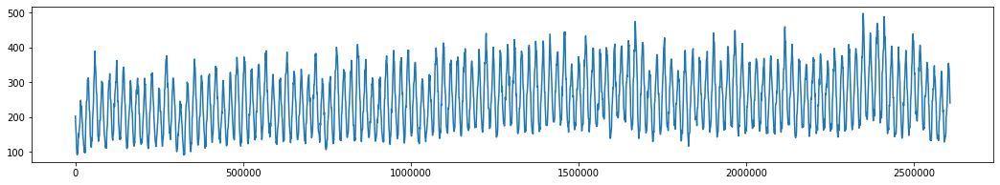

[None, False, 'add', 24, False, False] 5.834794808895276
55


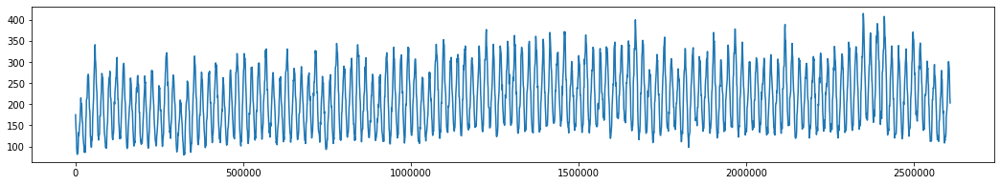

[None, False, 'add', 24, False, False] 5.739873225505832
56


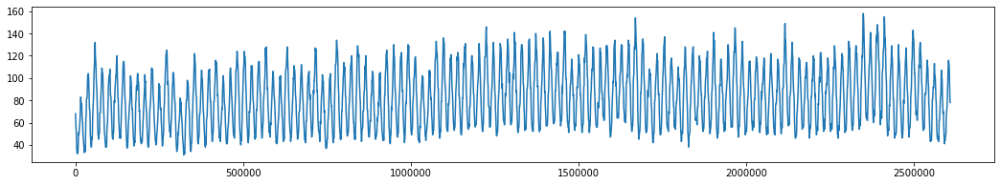

[None, False, 'add', 24, False, False] 2.171714017745955
57


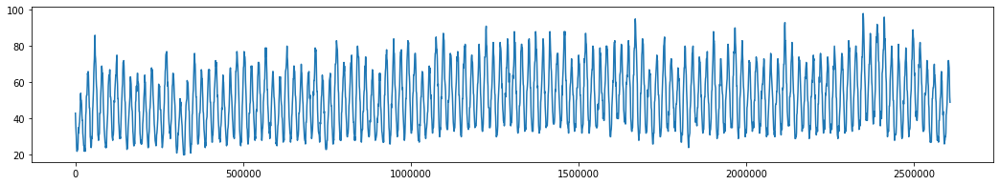

[None, False, 'add', 24, False, False] 1.7223962823820198
58


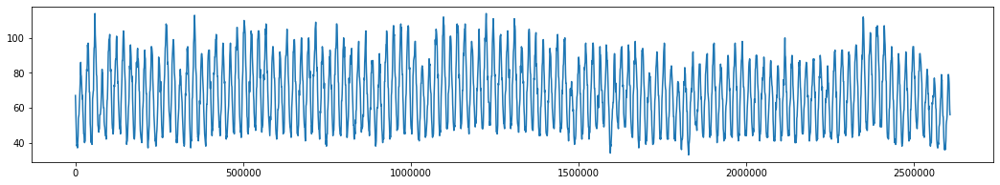

[None, False, 'add', 24, False, False] 0.8014502130565252
59


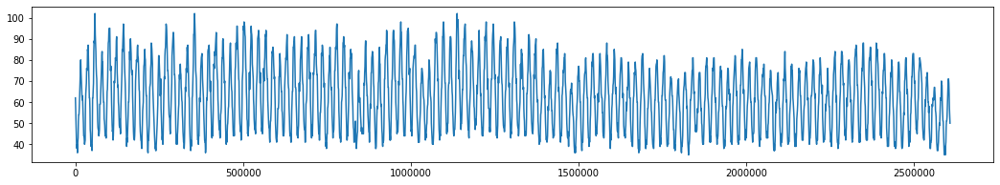

[None, False, 'add', 24, False, True] 0.8513187404217636
60


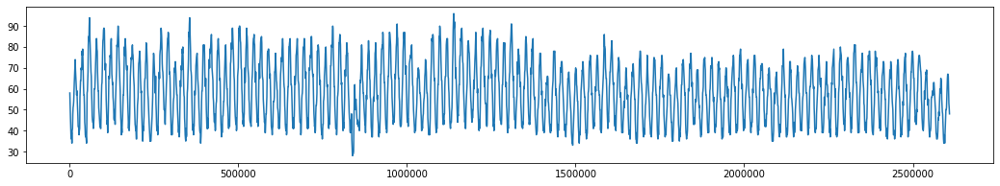

[None, False, 'add', 24, False, True] 1.3481550110897436
61


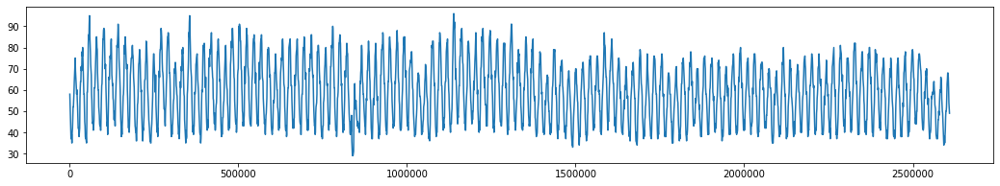

[None, False, 'add', 24, False, True] 0.7019823313982946
62


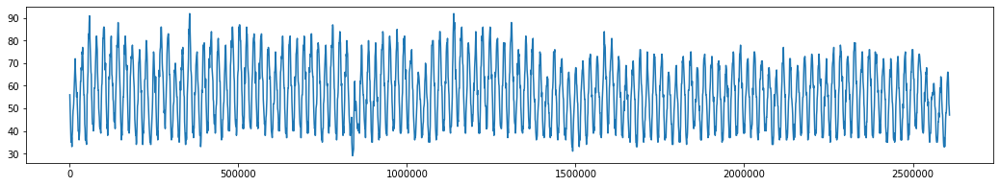

[None, False, 'add', 24, False, True] 1.1155581472994802
63


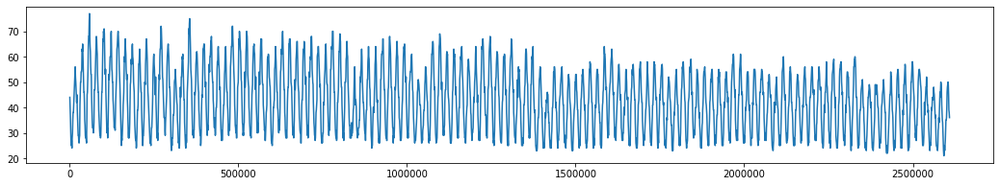

[None, False, 'add', 24, True, False] 1.1425415084493984
64


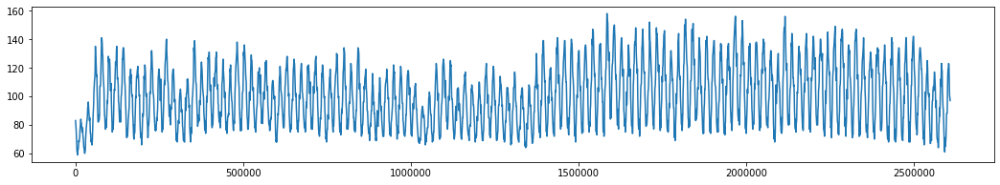

[None, False, 'add', 24, False, False] 2.2739583374449084
65


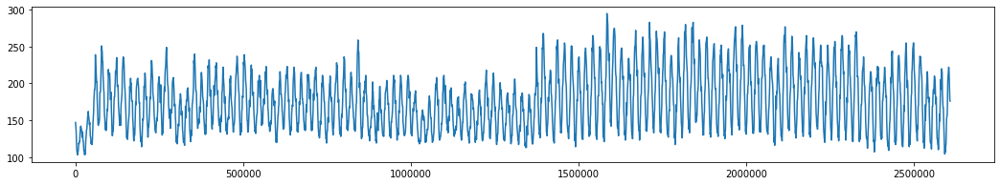

[None, False, 'add', 24, False, False] 4.167239808359734
66


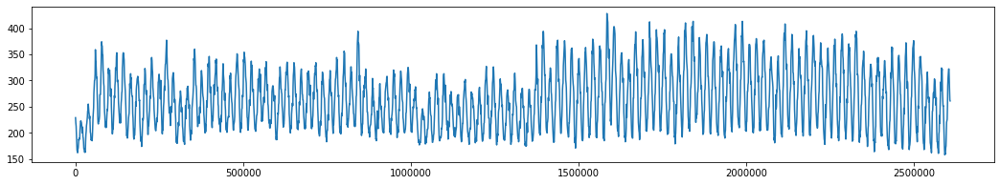

[None, False, 'add', 24, False, False] 5.581613625896831
67


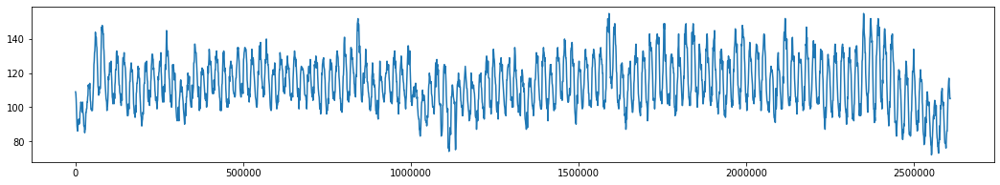

[None, False, 'add', 24, False, False] 2.7965904088961726
68


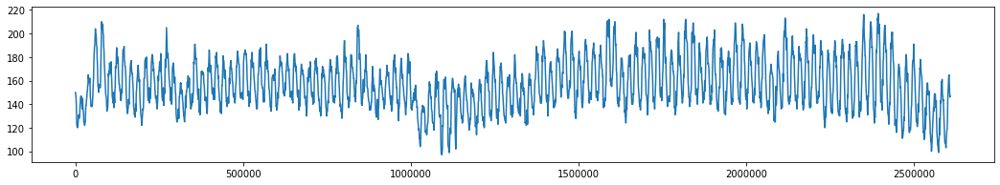

[None, False, 'add', 24, False, False] 3.1866564833417277
69


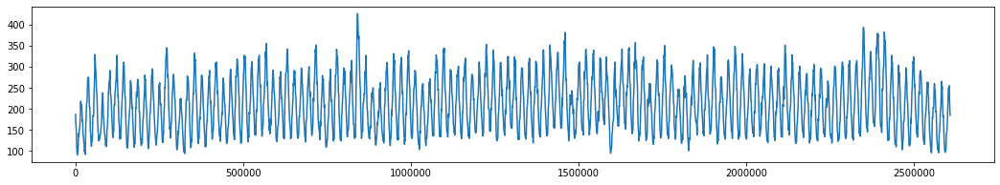

[None, False, 'add', 24, False, False] 4.1462078650765335
70


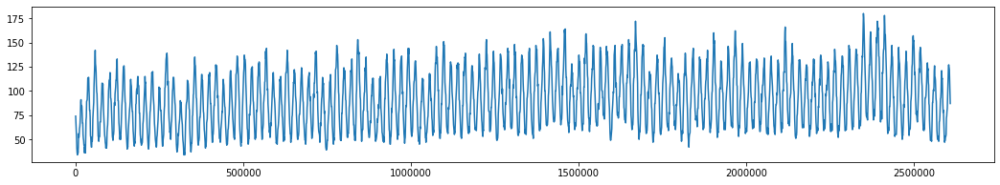

[None, False, 'add', 24, False, False] 2.048755878572047
71


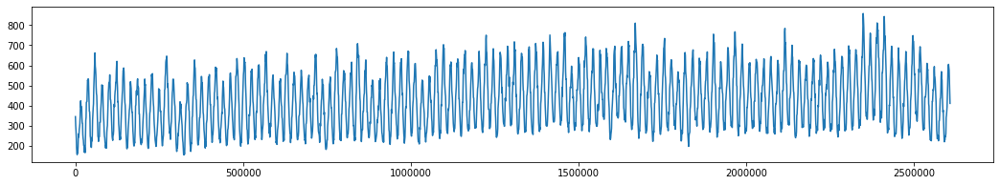

[None, False, 'add', 24, False, False] 10.198175185872277
72


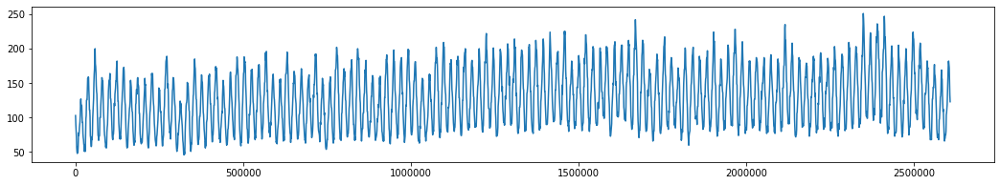

[None, False, 'add', 24, False, False] 3.1372577504530486
73


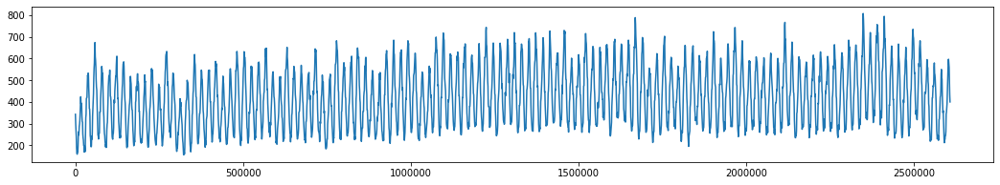

[None, False, 'add', 24, False, False] 10.276080051969004
74


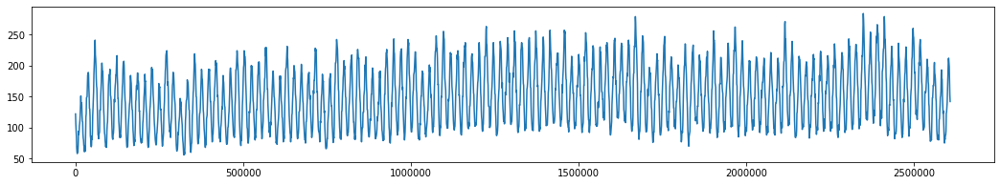

[None, False, 'add', 24, False, False] 3.7978175861551366
75


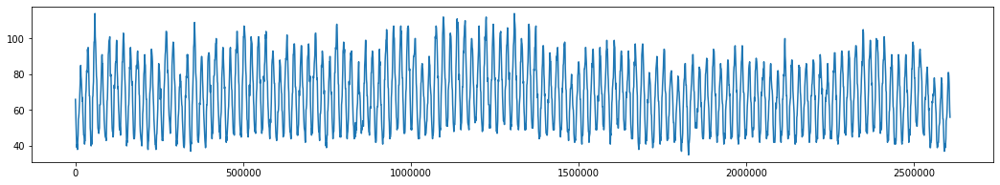

[None, False, 'add', 24, False, True] 0.6805789701598678
76


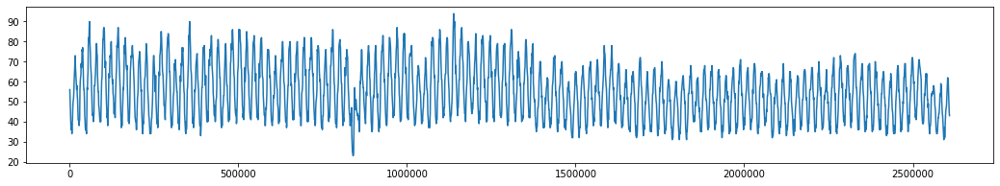

[None, False, 'add', 24, False, True] 0.8941471501765653
77


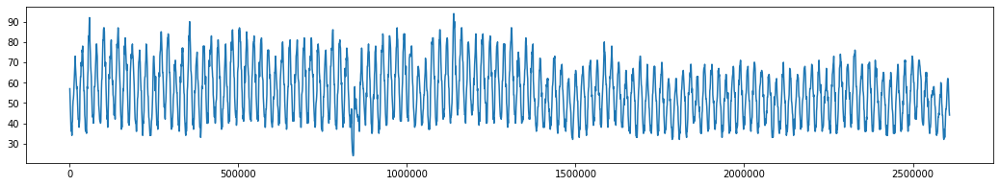

[None, False, 'add', 24, False, True] 0.6075703087107552
78


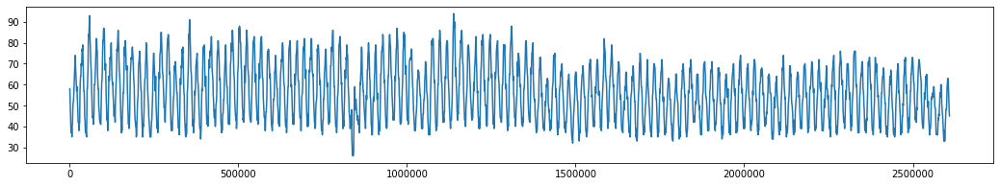

[None, False, 'add', 24, False, True] 0.49435036402254623
79


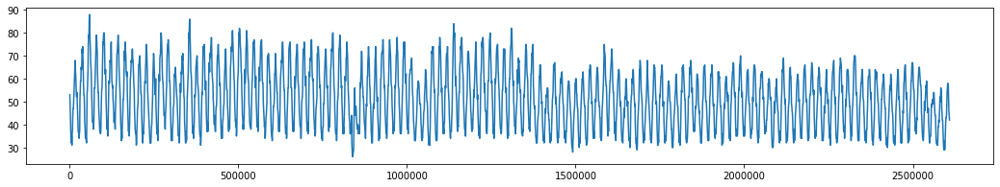

[None, False, 'add', 24, False, False] 0.8267460096499762
80


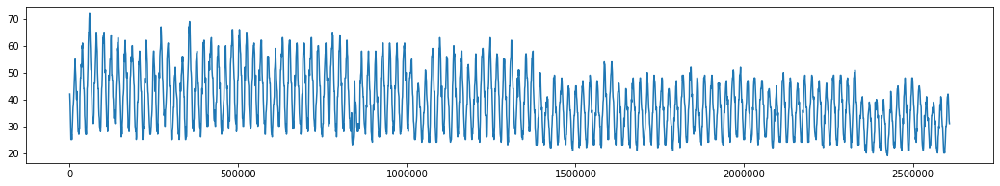

[None, False, 'mul', 24, False, False] 0.35069281263476637
81


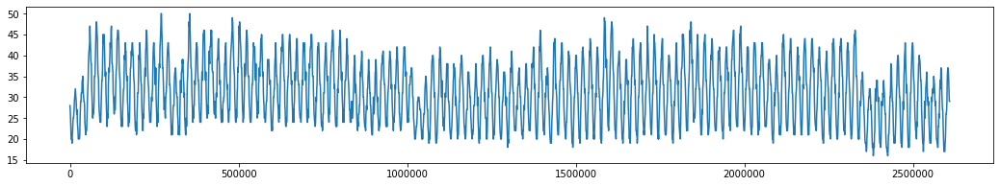

[None, False, 'mul', 24, False, True] 0.44771668193979464
82


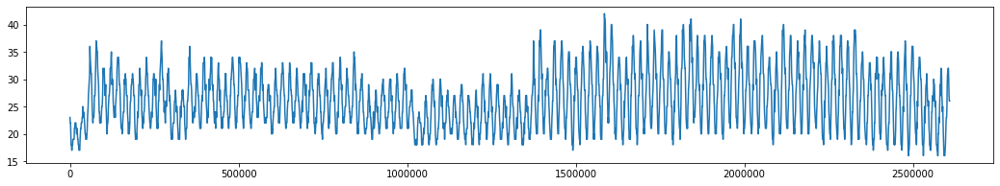

[None, False, 'add', 24, False, False] 0.6532475575975867
83


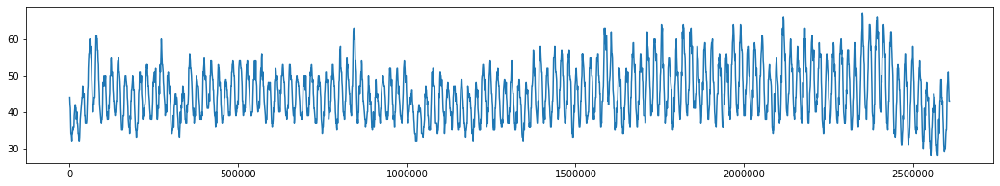

[None, False, 'mul', 24, True, False] 0.9410450812042973
84


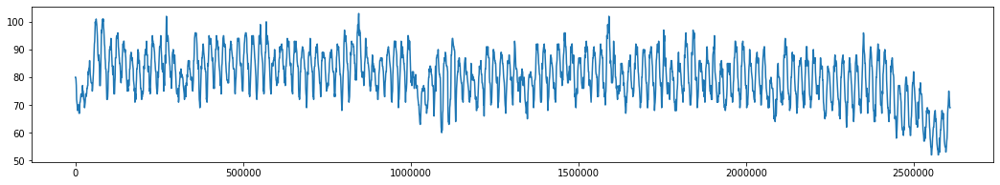

[None, False, 'add', 24, False, True] 1.121071835459095
85


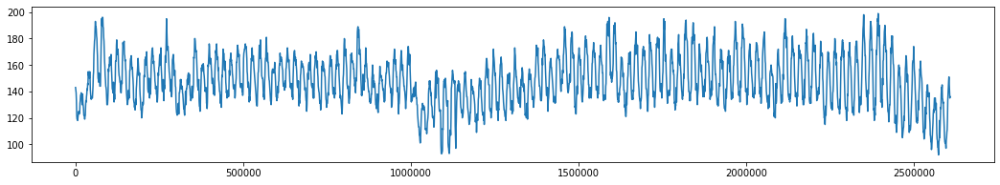

[None, False, 'add', 24, False, True] 2.9351387030780236
86


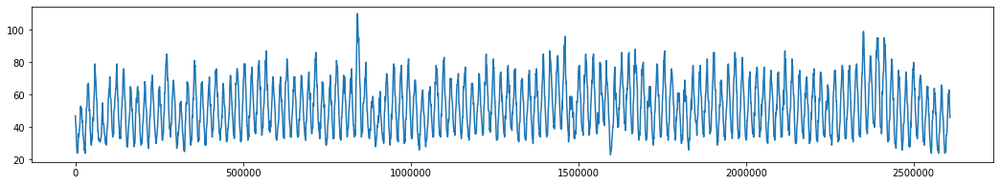

[None, False, 'add', 24, False, False] 1.004892995022993
87


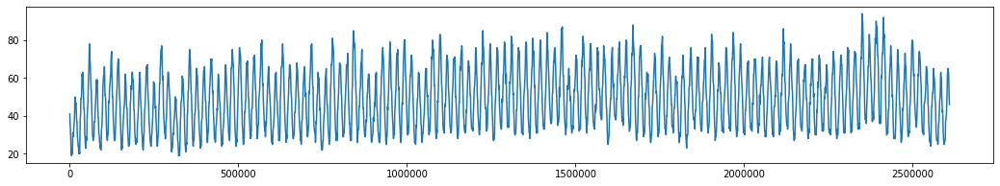

[None, False, 'add', 24, False, False] 0.8911928871133145
88


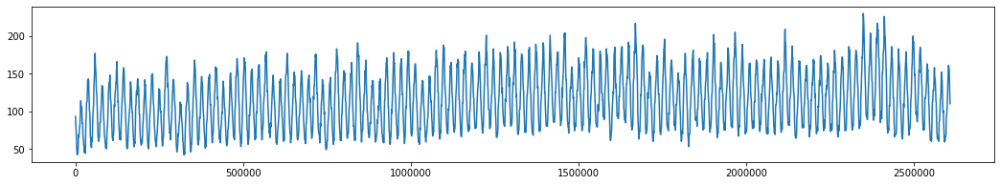

[None, False, 'add', 24, False, False] 2.8562659966628607
89


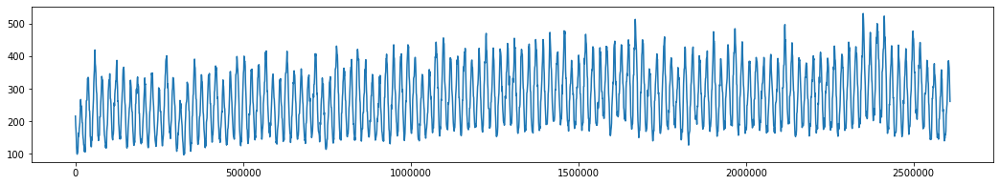

[None, False, 'add', 24, False, False] 6.795655486512309
90


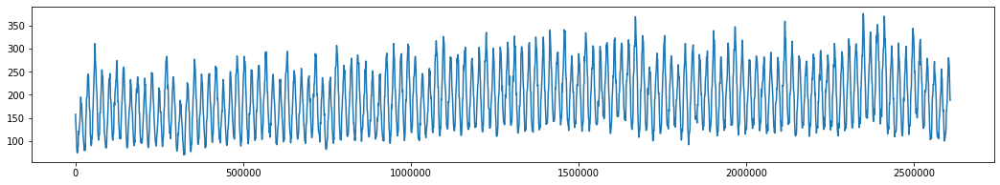

[None, False, 'add', 24, False, False] 5.0900060732613355
91


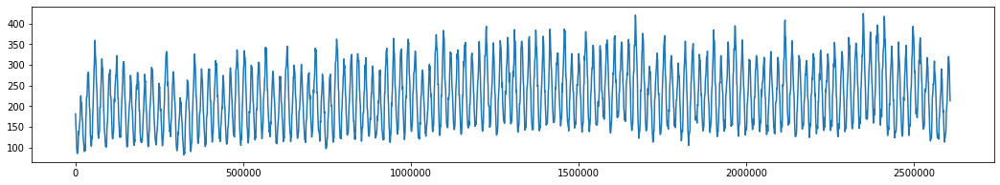

[None, False, 'add', 24, False, False] 5.232697609129404
92


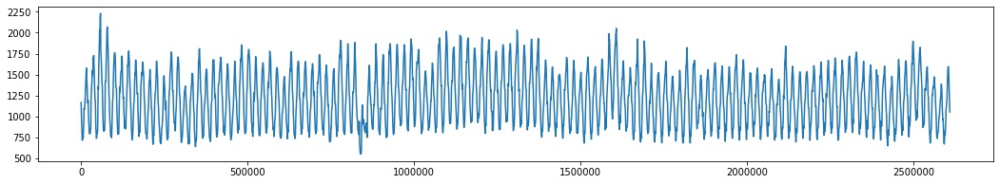

[None, False, 'add', 24, False, True] 26.641882114349865
93


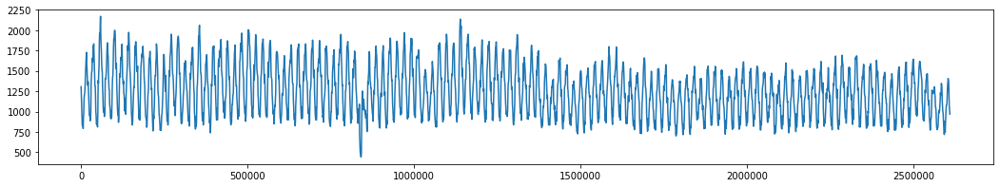

[None, False, 'add', 24, False, True] 28.599056085770087
94


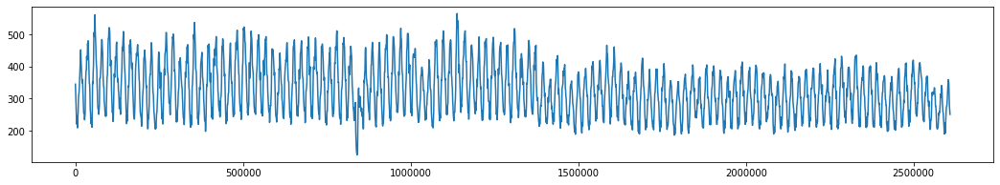

[None, False, 'add', 24, False, True] 5.493687627968156
95


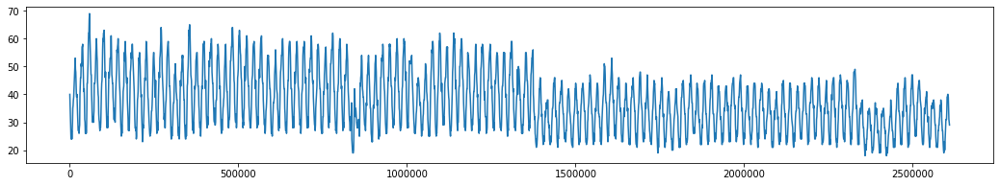

[None, False, 'add', 24, True, False] 0.82172901409279
96


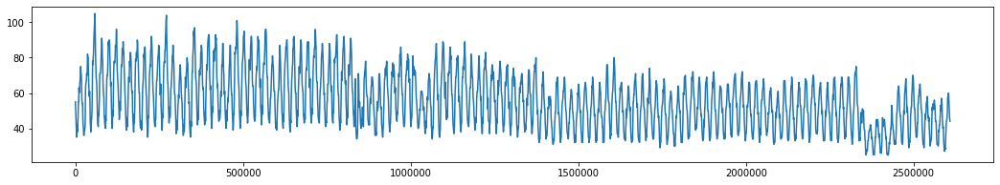

[None, False, 'mul', 24, True, False] 0.5474319832252866
97


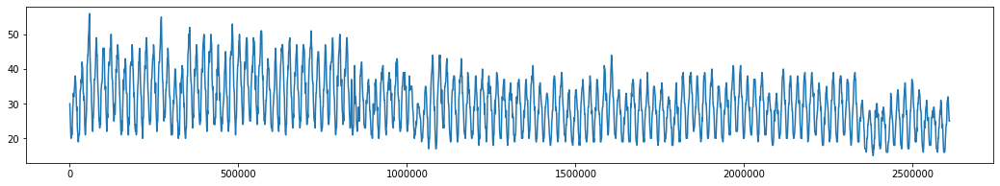

[None, False, 'mul', 24, True, False] 0.5655819832685779
98


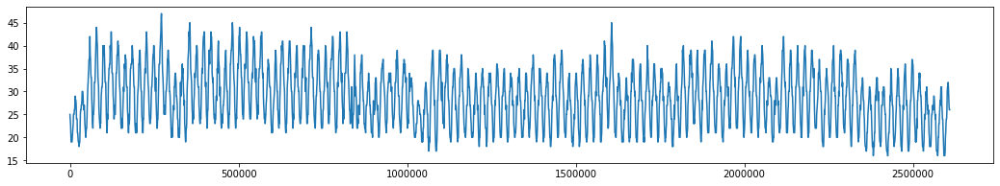

[None, False, 'mul', 24, True, True] 0.5345632886906493
99


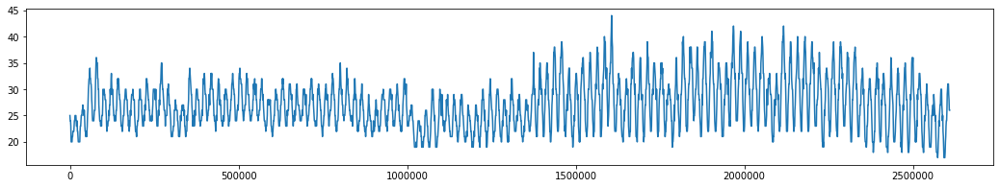

[None, False, 'mul', 24, True, False] 0.8517117846234277
100


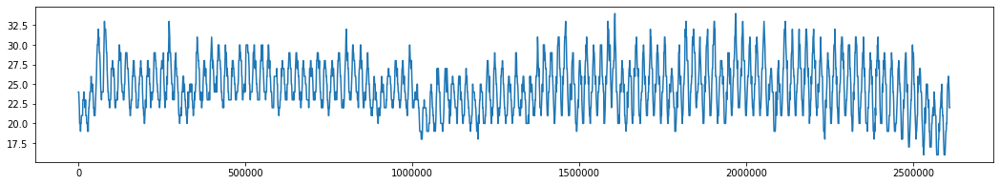

[None, False, 'mul', 24, True, False] 0.6517796412023257
101


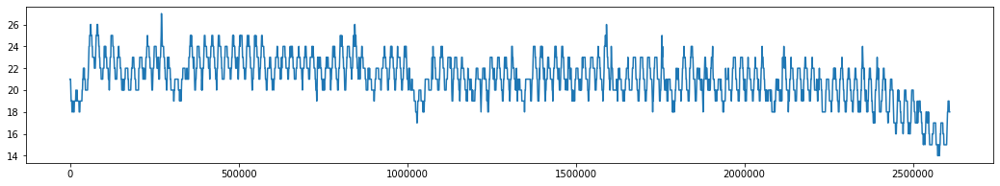

[None, False, 'add', 24, False, True] 0.39167619597616443
102


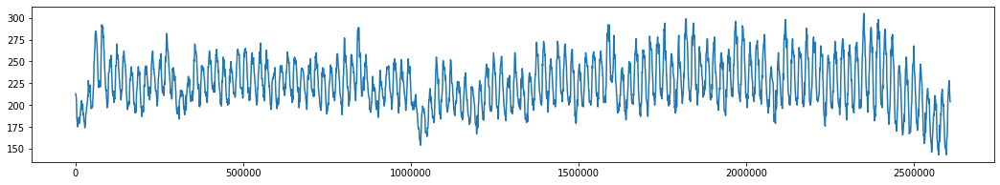

[None, False, 'add', 24, False, True] 3.2689706793258324
103


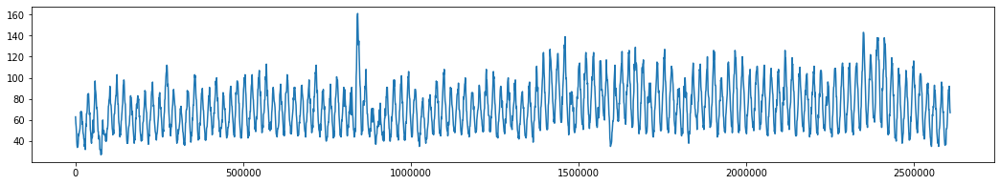

[None, False, 'add', 24, False, False] 2.1082323493008963
104


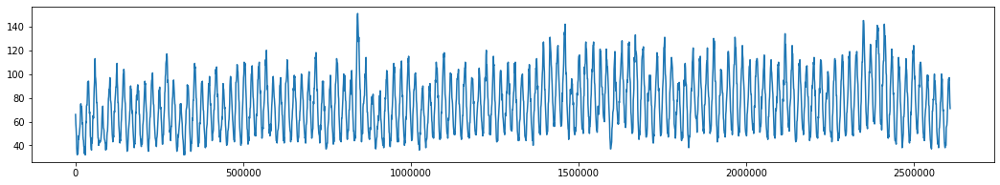

[None, False, 'add', 24, False, False] 1.232787914396226
105


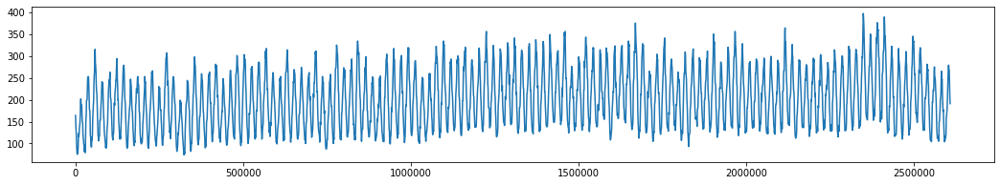

[None, False, 'add', 24, False, False] 3.5993839842961877
106


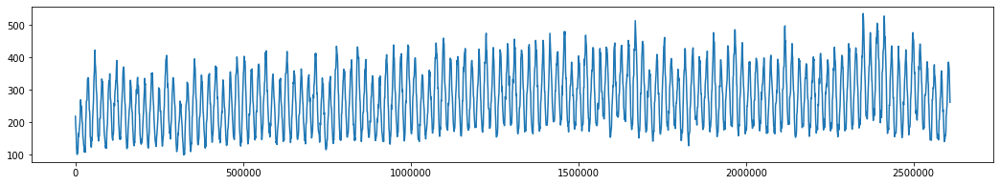

[None, False, 'add', 24, False, False] 6.390869088552979
107


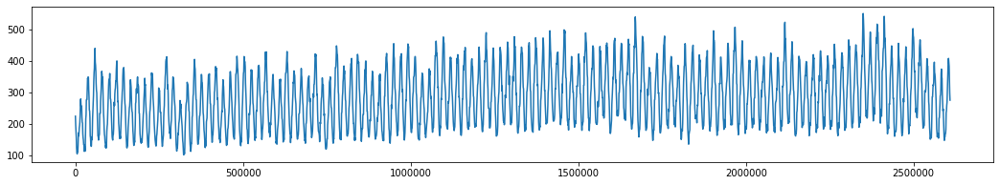

[None, False, 'add', 24, False, False] 6.83598276940976
108


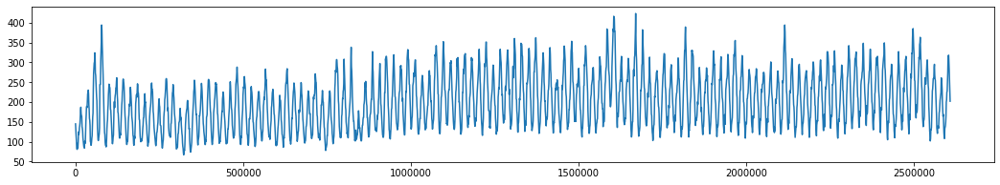

[None, False, 'mul', 24, False, False] 5.148215071963407
109


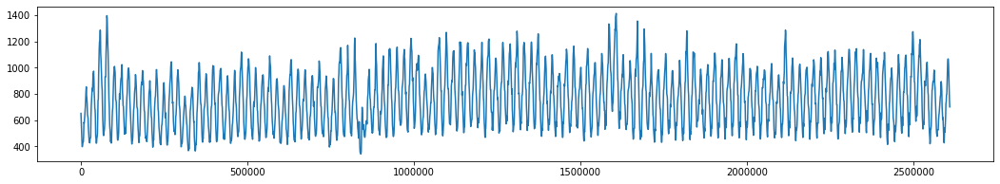

[None, False, 'add', 24, False, False] 17.235781742005926
110


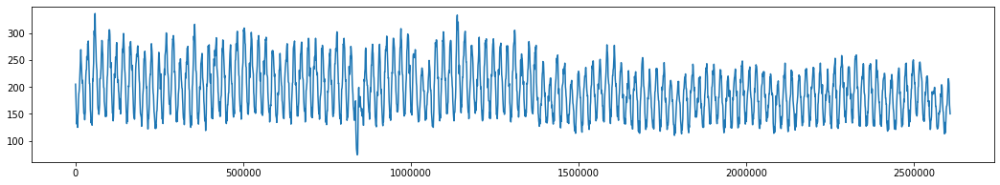

[None, False, 'add', 24, False, True] 3.2775474605676562
111


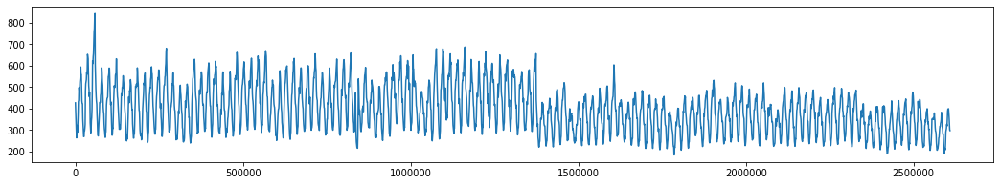

[None, False, 'mul', 24, False, True] 6.375185000160572
112


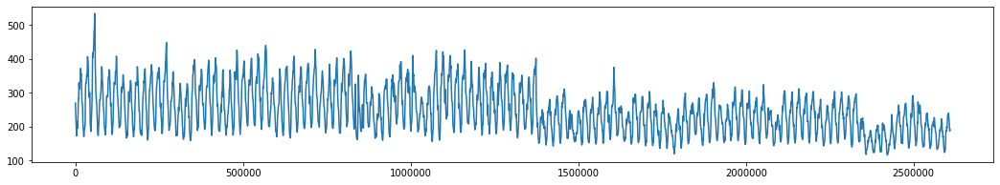

[None, False, 'mul', 24, True, False] 6.785632244833811
113


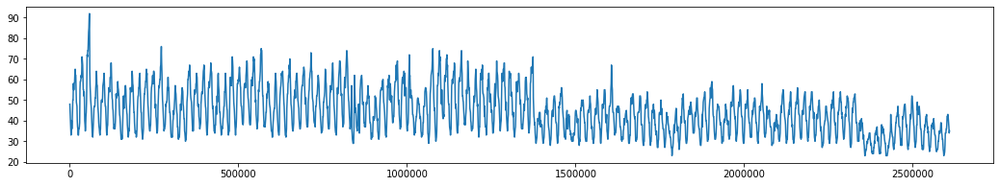

[None, False, 'mul', 24, True, False] 1.173431791885692
114


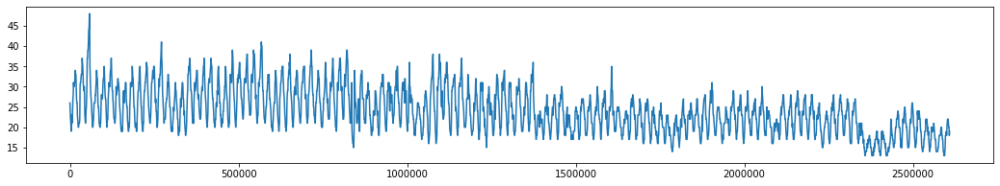

[None, False, 'mul', 24, True, True] 1.0442759172402538
115


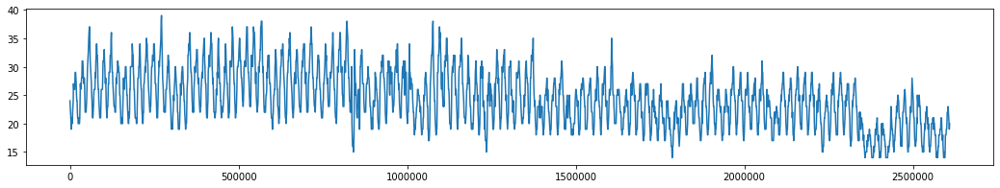

[None, False, 'mul', 24, True, True] 0.7411255340087135
116


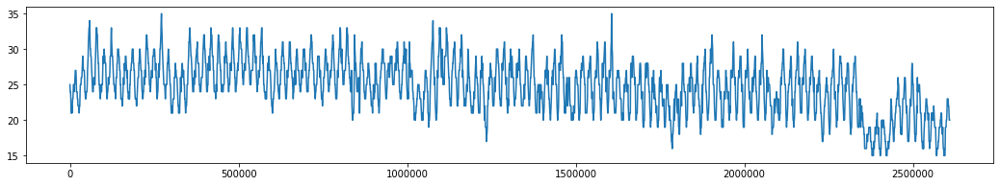

[None, False, 'mul', 24, False, False] 0.3446286587930888
117


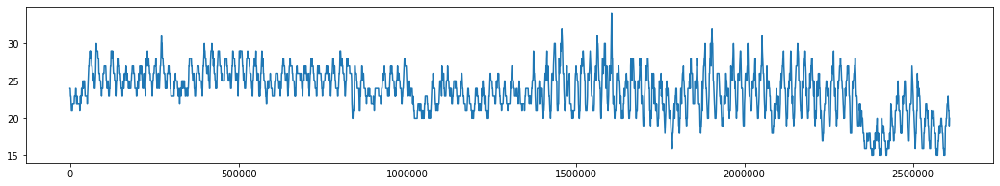

[None, False, 'mul', 24, True, True] 1.0604266011235137
118


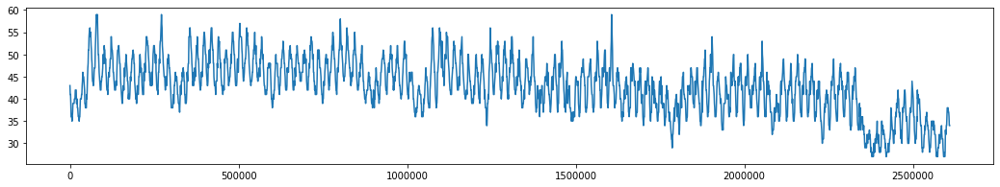

[None, False, 'add', 24, False, False] 0.7925432749611763
119


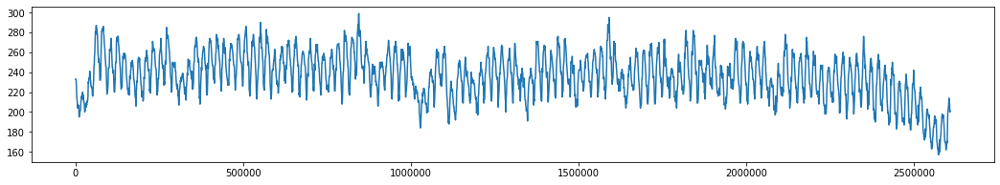

[None, False, 'add', 24, True, True] 3.1120998424386794
120


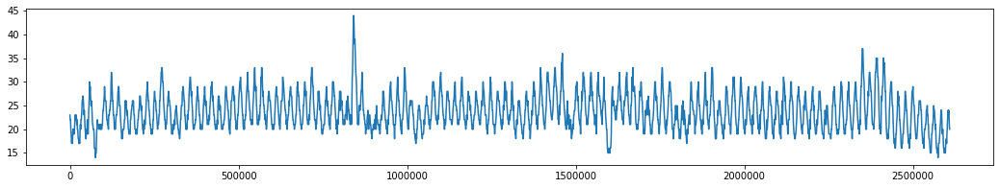

[None, False, 'add', 24, False, True] 0.43371627913788097
121


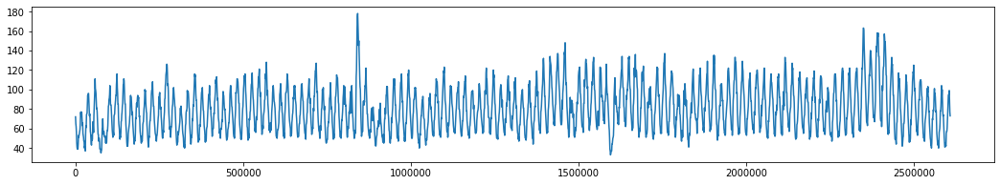

[None, False, 'add', 24, False, False] 2.0536773598560933
122


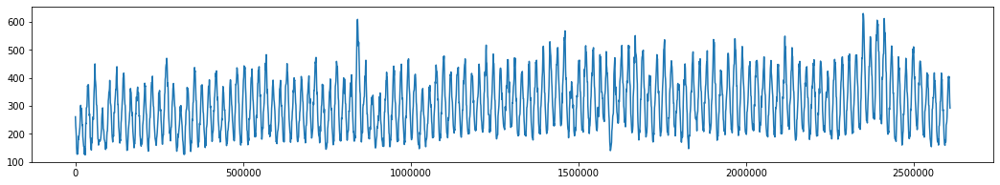

[None, False, 'add', 24, False, False] 5.270483433921631
123


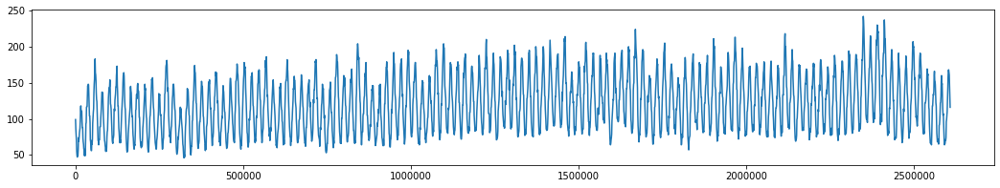

[None, False, 'add', 24, False, False] 2.5799848611878318
124


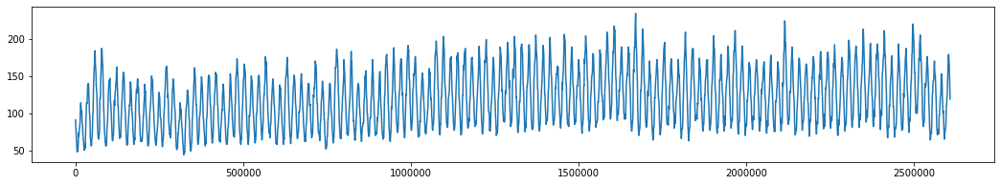

[None, False, 'add', 24, False, False] 3.26151359859501
125


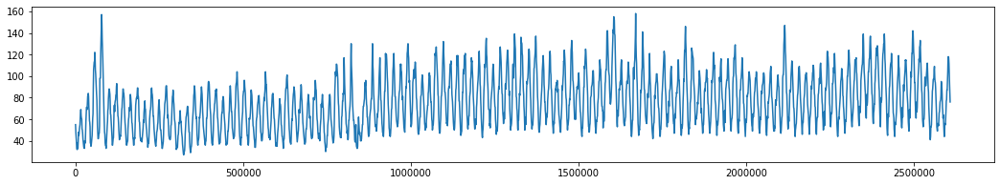

[None, False, 'mul', 24, True, True] 2.5244710251935207
126


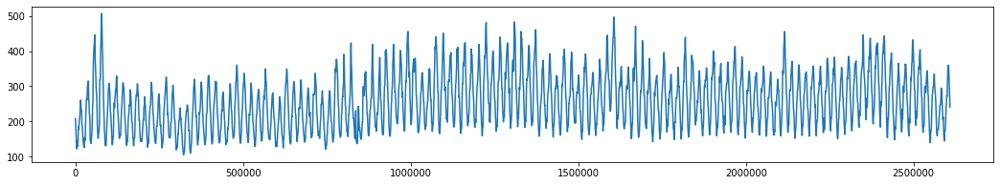

[None, False, 'mul', 24, False, False] 6.225942333071126
127


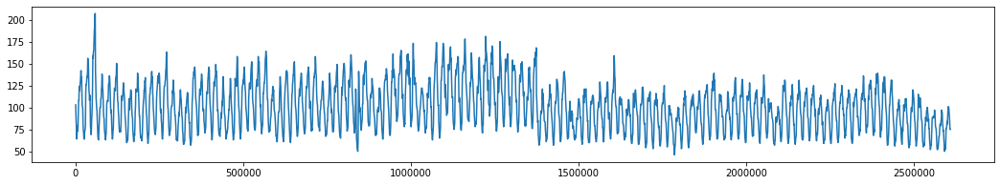

[None, False, 'mul', 24, True, False] 2.844594066402744
128


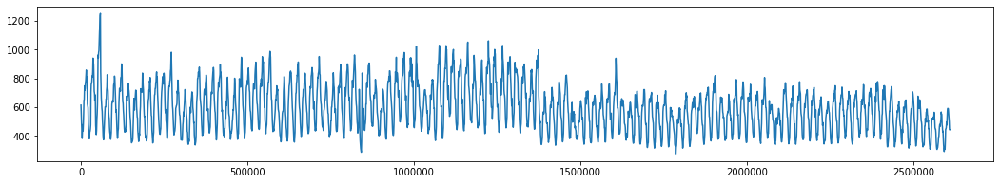

[None, False, 'mul', 24, True, False] 17.129961029291934
129


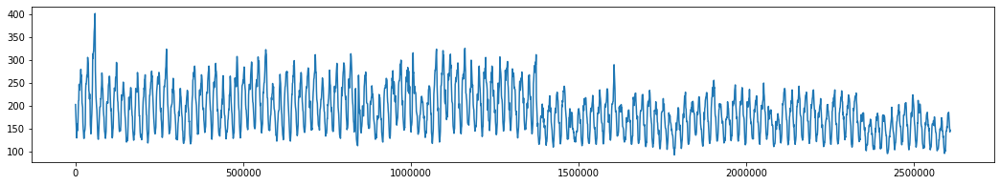

[None, False, 'mul', 24, True, False] 5.675850553487106
130


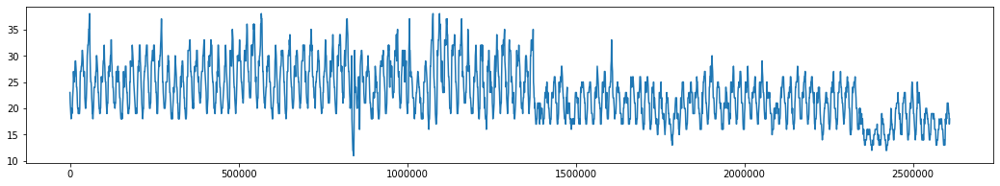

[None, False, 'mul', 24, True, True] 0.9939659005365127
131


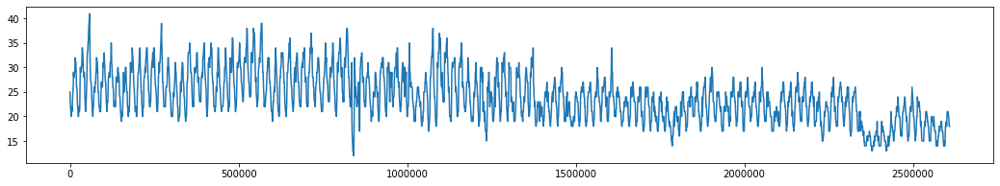

[None, False, 'mul', 24, True, True] 0.4331392255132328
132


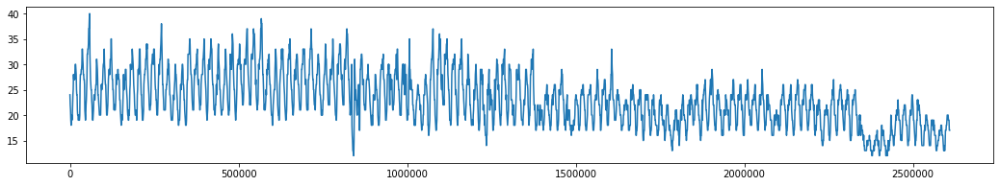

[None, False, 'mul', 24, True, True] 0.8896421595668155
133


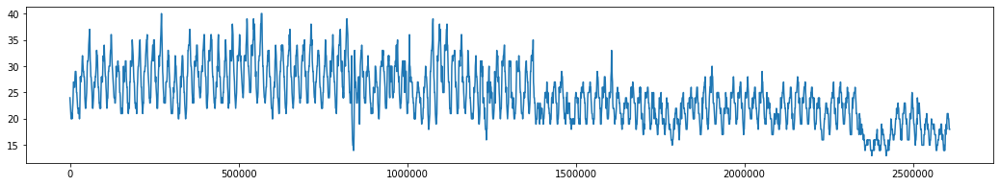

[None, False, 'mul', 24, True, True] 0.3769763528865574
134


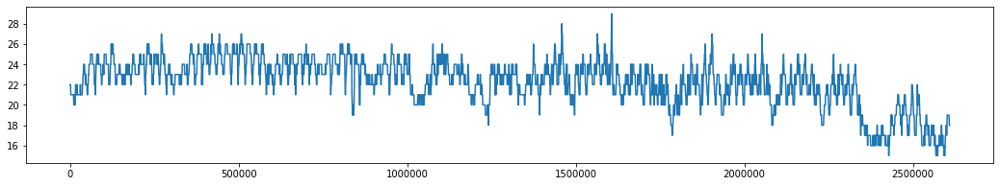

[None, False, 'add', 24, False, True] 0.48148795306159614
135


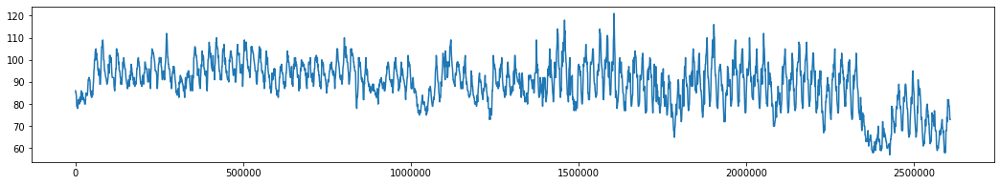

[None, False, 'mul', 24, False, True] 1.4230176638034646
136


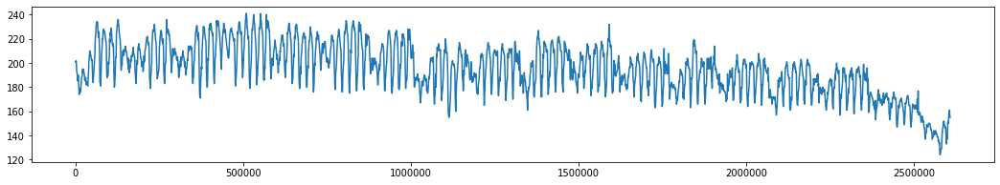

[None, False, None, 0, True, True] 2.7803273822863805
137


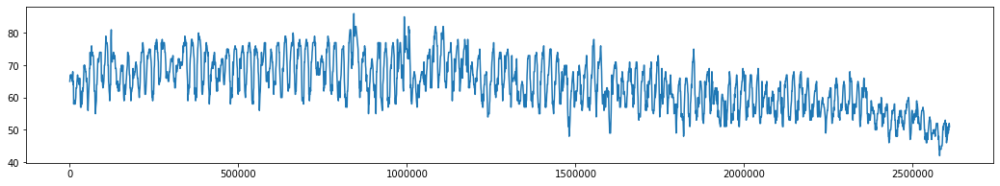

[None, False, 'mul', 24, True, True] 1.027260186948954
138


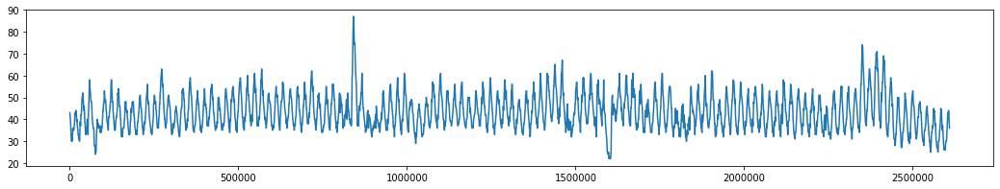

[None, False, 'add', 24, False, True] 0.34287872841506545
139


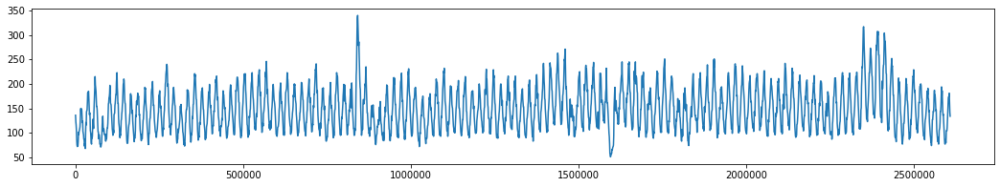

[None, False, 'add', 24, False, False] 2.738653221713676
140


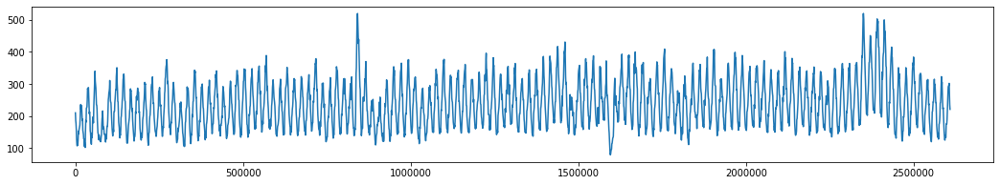

[None, False, 'add', 24, False, False] 4.480641684168855
141


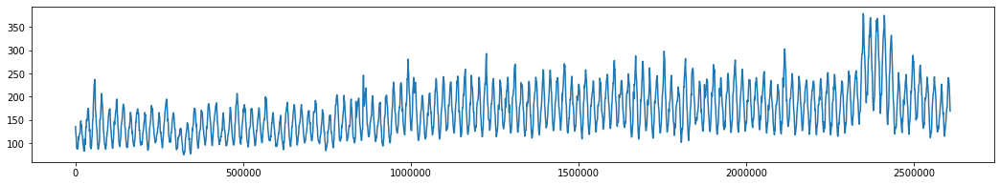

[None, False, 'add', 24, False, False] 2.955914565894658
142


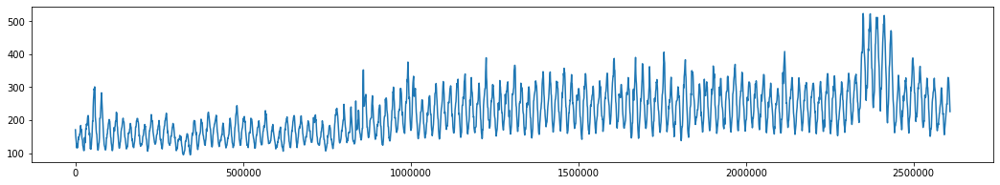

[None, False, 'mul', 24, True, False] 4.6376679445474815
143


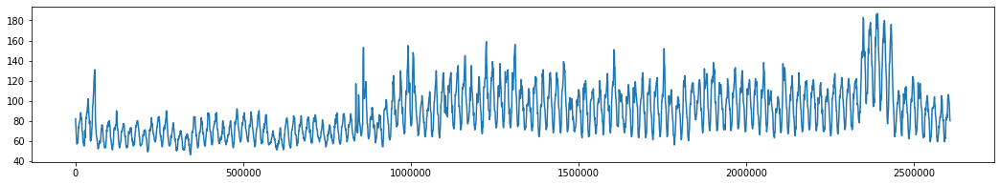

[None, False, 'mul', 24, True, False] 2.1112012771968507
144


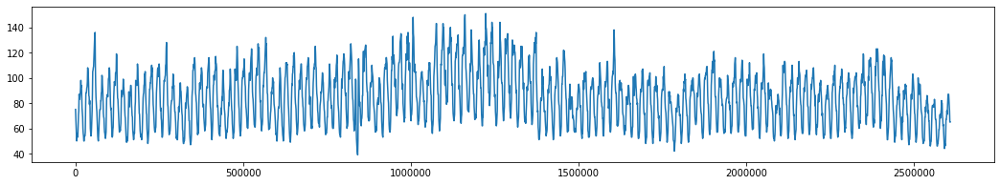

[None, False, 'mul', 24, True, False] 2.869795974539125
145


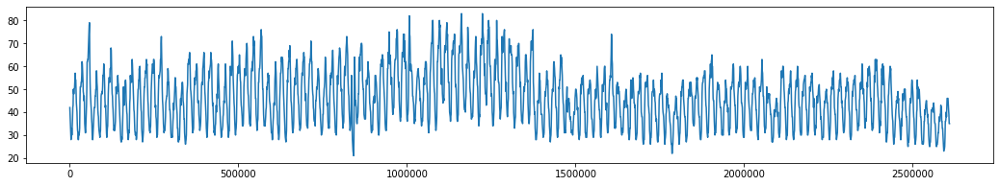

[None, False, 'mul', 24, True, False] 1.3202420031070365
146


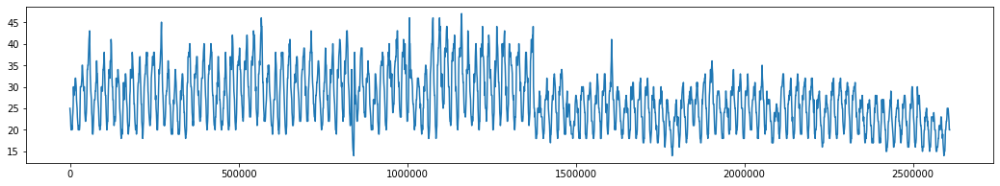

[None, False, 'mul', 24, True, True] 0.5878623931538197
147


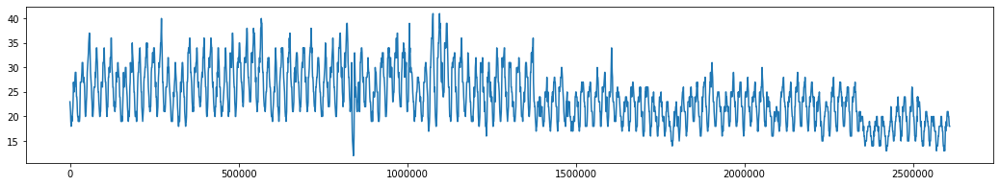

[None, False, 'mul', 24, True, True] 0.4751789219252899
148


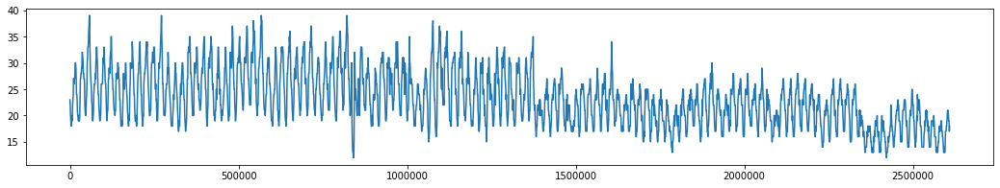

[None, False, 'mul', 24, True, True] 1.0588941797086864
149


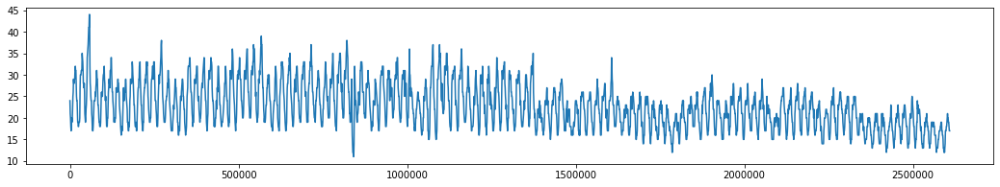

[None, False, 'mul', 24, True, True] 0.5008103525855775
150


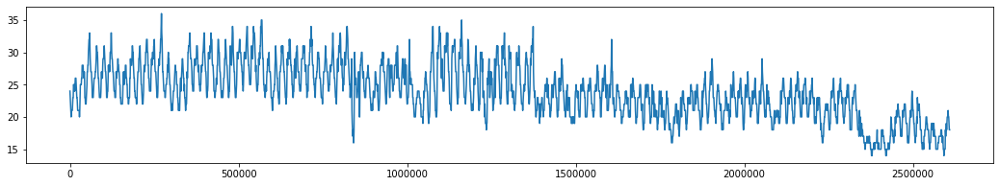

[None, False, 'mul', 24, True, False] 0.3533969265320151
151


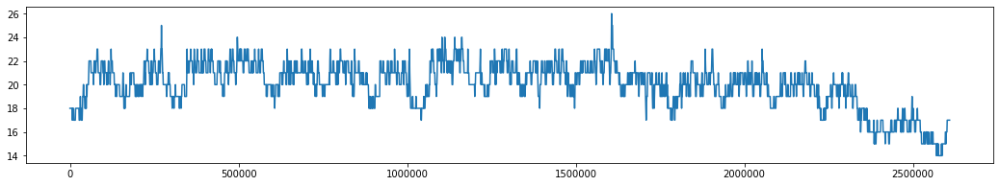

[None, False, None, 0, True, False] 0.00014034240259467868
152


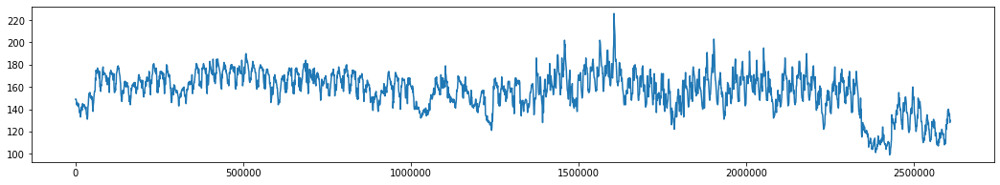

[None, False, None, 0, False, True] 4.230350211273892
153


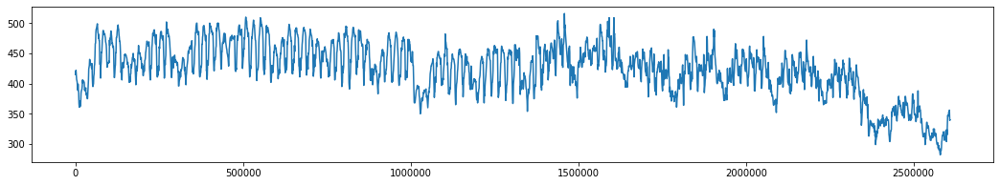

[None, False, 'mul', 24, True, True] 9.12334679581673
154


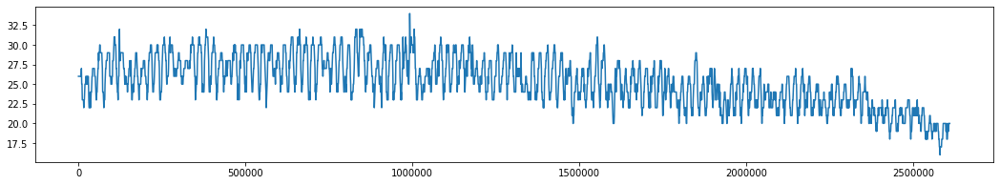

[None, False, 'mul', 24, True, True] 0.4218384221522981
155


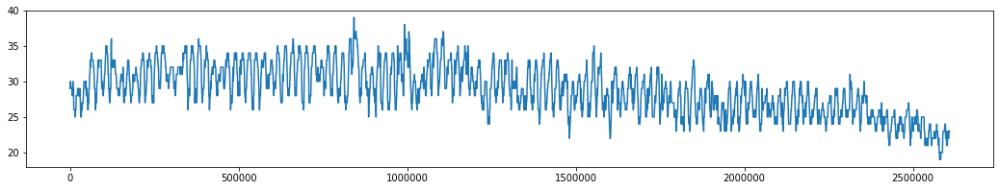

[None, False, 'mul', 24, True, True] 0.4767445179916731
156


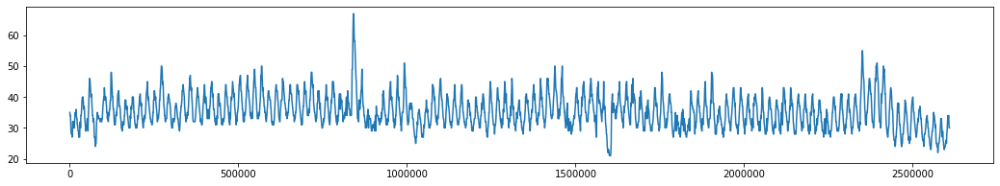

[None, False, 'add', 24, False, False] 0.5732790494086236
157


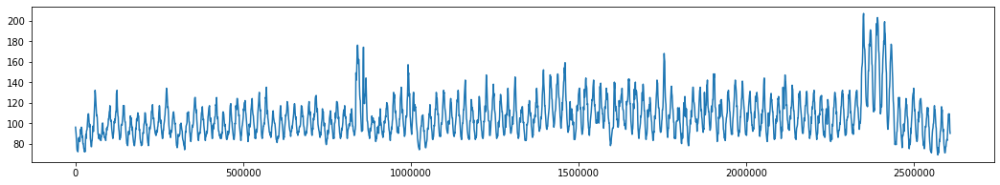

[None, False, 'mul', 24, False, False] 2.8940976767971556
158


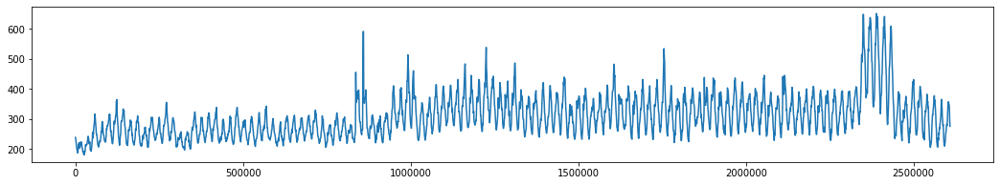

[None, False, 'mul', 24, True, False] 9.84996219928244
159


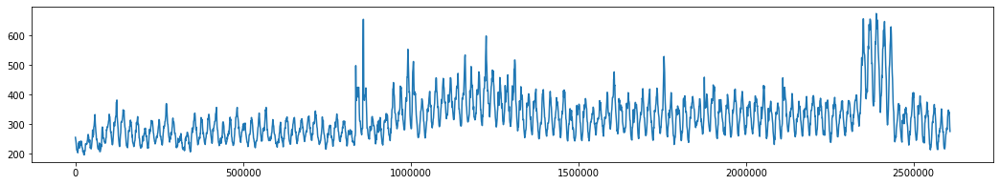

[None, False, 'add', 24, False, True] 10.552712858504432
160


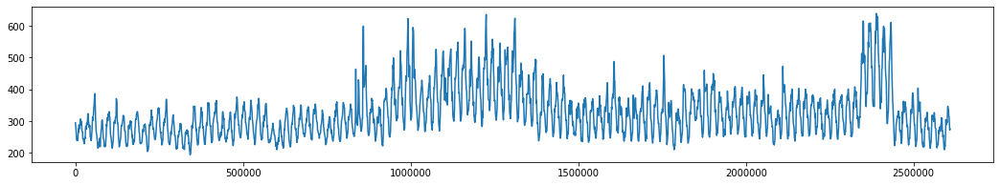

[None, False, 'add', 24, True, False] 7.931495327871885
161


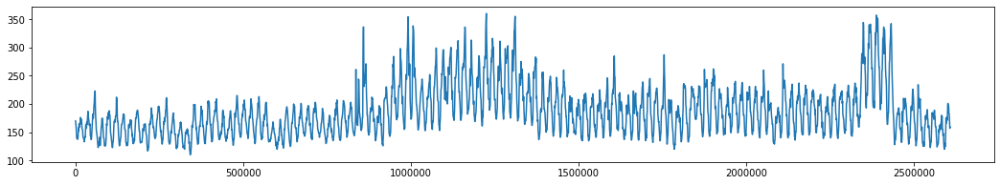

[None, False, 'add', 24, True, True] 3.921607217796243
162


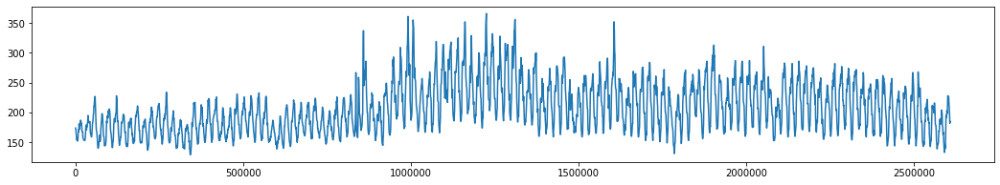

[None, False, 'add', 24, True, True] 4.8640564261756065
163


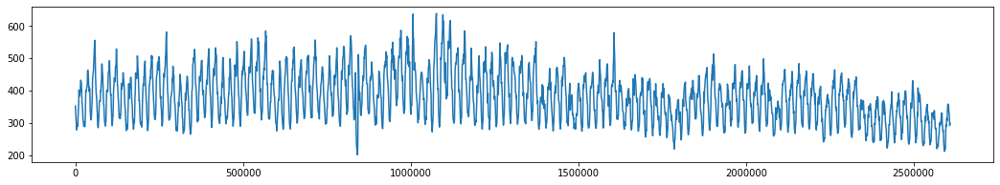

[None, False, 'mul', 24, True, False] 11.138831815859719
164


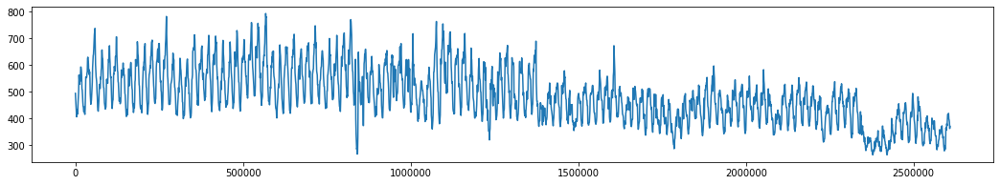

[None, False, 'mul', 24, True, False] 12.035646571756704
165


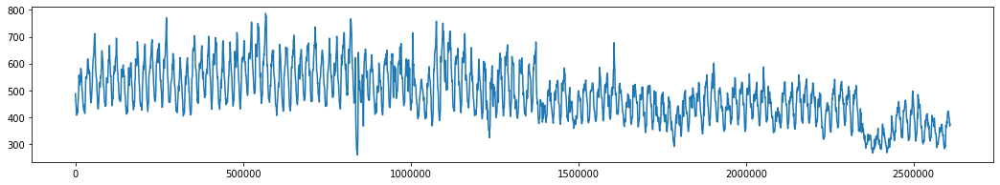

[None, False, 'mul', 24, True, False] 12.185904167477865
166


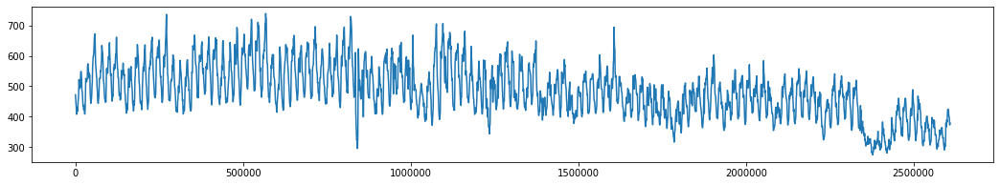

[None, False, 'mul', 24, True, False] 10.975475563234031
167


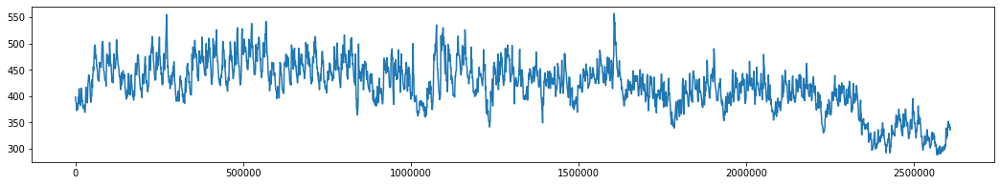

[None, False, None, 0, False, False] 6.304760106459246
168


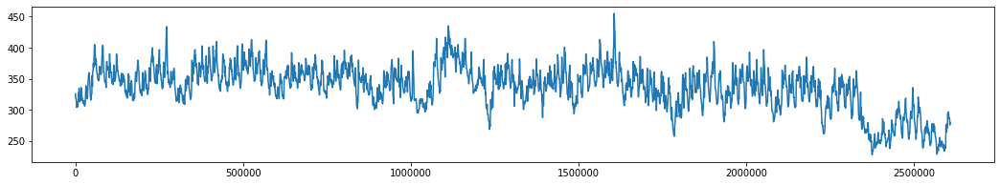

[None, False, 'mul', 24, False, False] 4.85364678595884
169


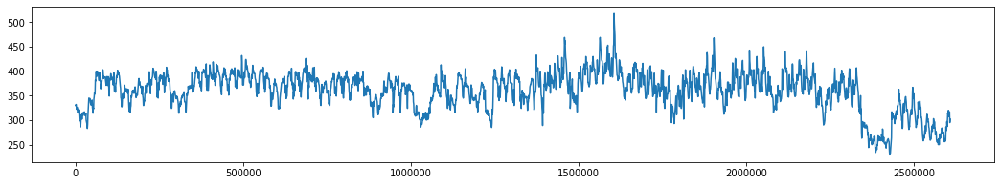

[None, False, None, 0, False, False] 12.065729529478087
170


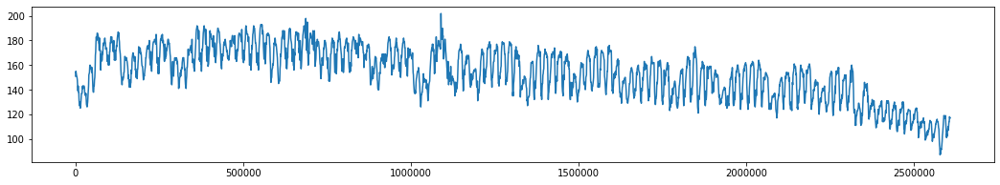

[None, False, 'mul', 24, True, True] 1.7783466334588427
171


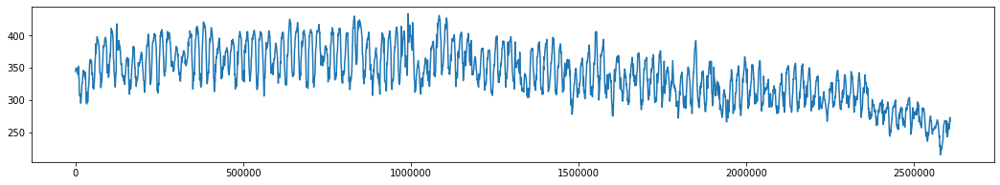

[None, False, 'mul', 24, False, True] 6.486024666821704
172


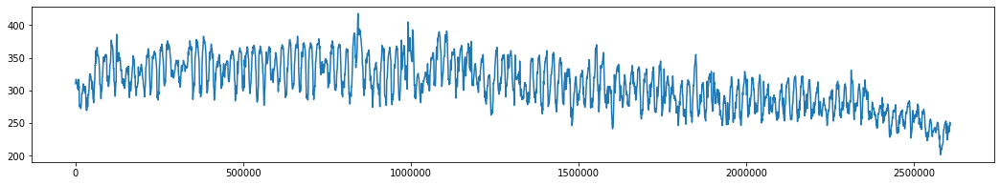

[None, False, 'mul', 24, False, False] 4.411257862196268
173


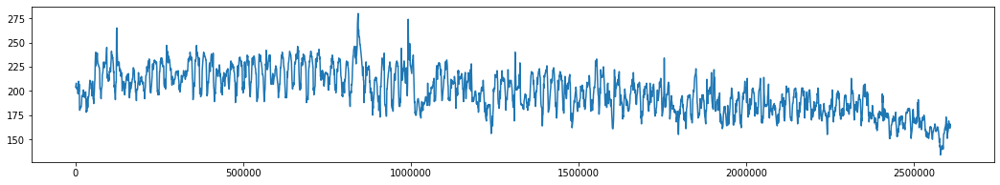

[None, False, None, 0, False, False] 2.5495097567963922
174


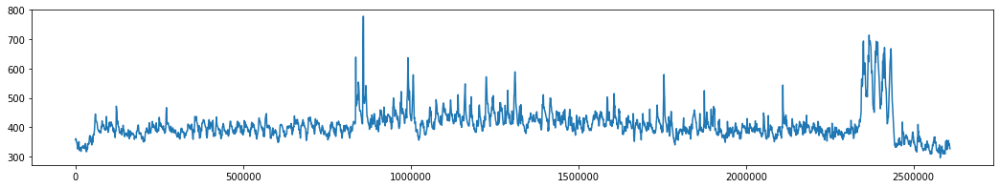

[None, False, None, 0, True, False] 6.273439459529325
175


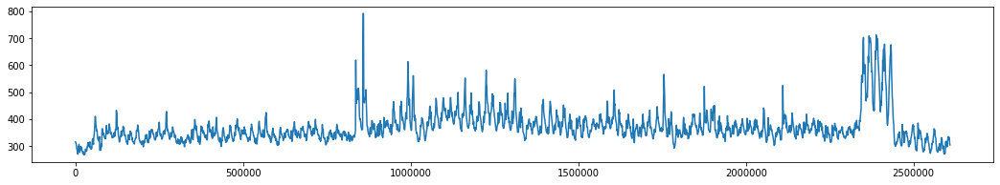

[None, False, 'mul', 24, False, True] 9.723817417351162
176


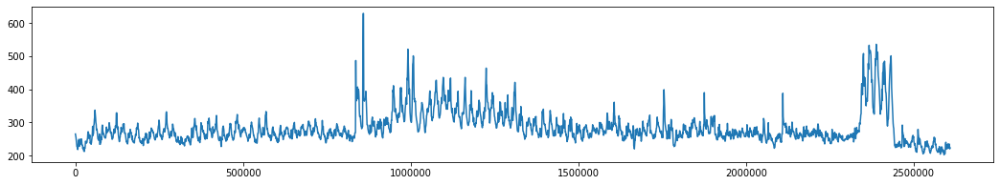

[None, False, 'mul', 24, True, False] 8.113442149781045
177


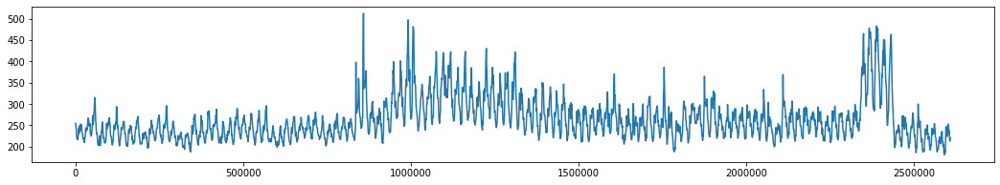

[None, False, 'add', 24, True, True] 7.194042568428576
178


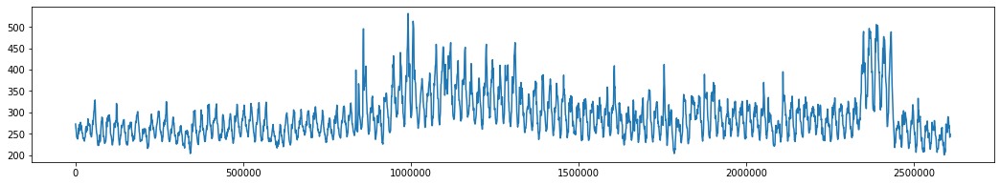

[None, False, 'add', 24, True, True] 6.9566776267019135
179


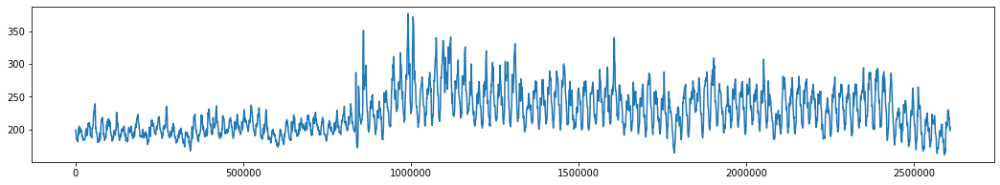

[None, False, 'mul', 24, False, True] 5.746105277032715
180


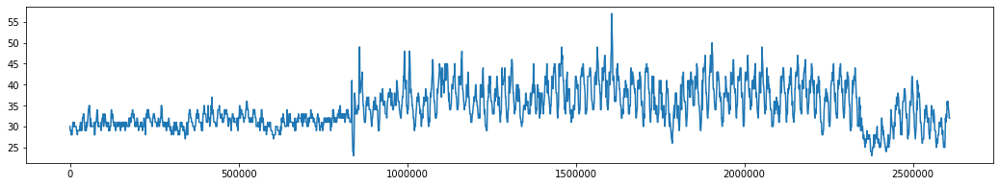

[None, False, 'mul', 24, False, True] 0.43908049138912636
181


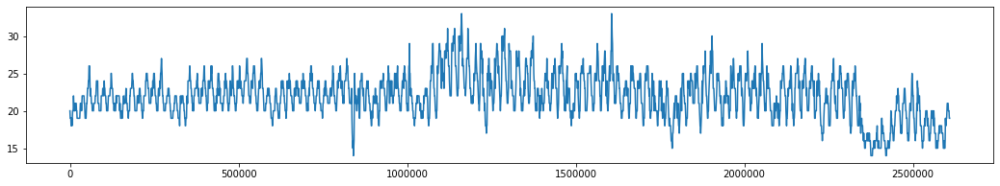

[None, False, None, 0, True, False] 0.4999999999999982
182


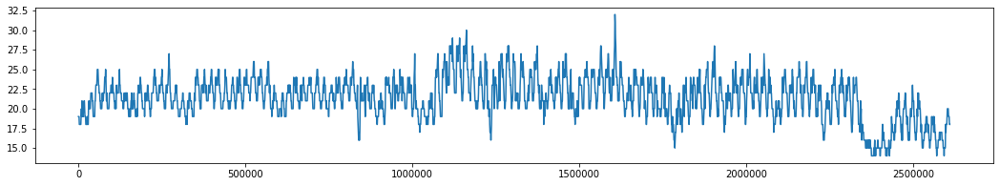

[None, False, 'mul', 24, False, False] 0.42634971948662104
183


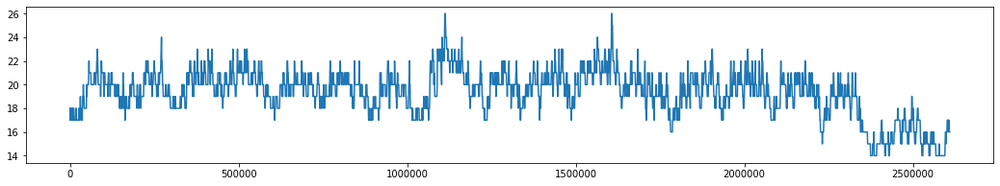

[None, False, 'mul', 24, True, False] 0.5722698503707925
184


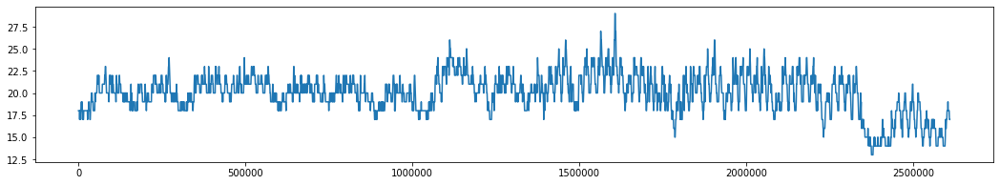

[None, False, 'add', 24, False, False] 0.3651610338139816
185


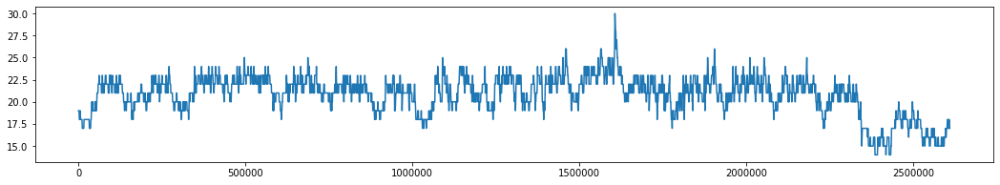

[None, False, 'add', 24, False, False] 0.591734978203697
186


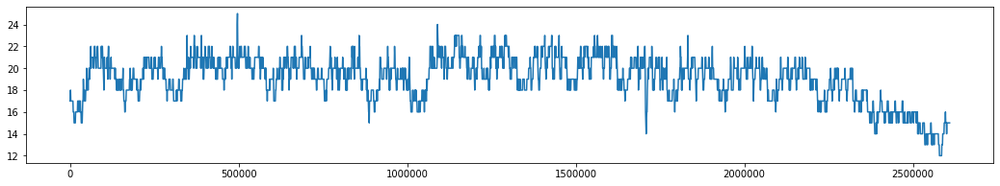

[None, False, None, 0, False, False] 0.00011438316648543124
187


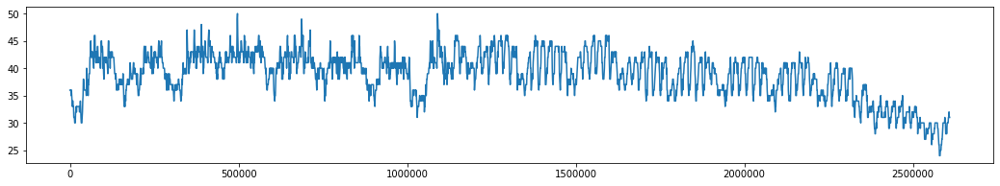

[None, False, 'mul', 24, True, True] 0.6647240122761404
188


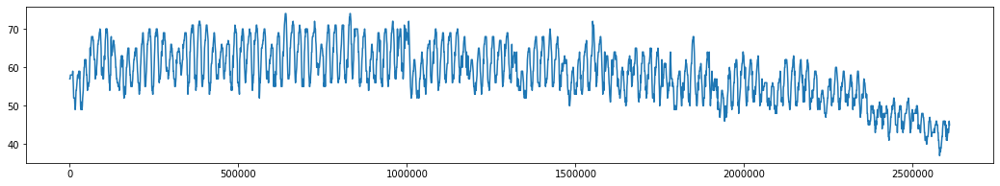

[None, False, 'mul', 24, True, False] 1.0660825487445742
189


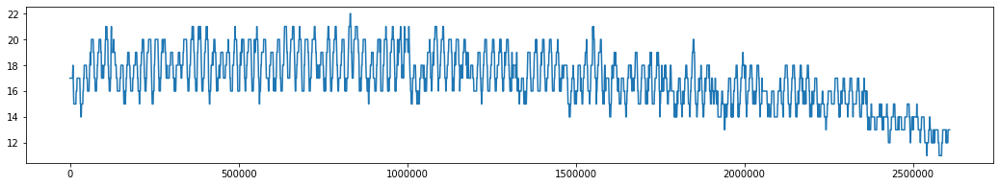

[None, False, None, 0, True, False] 0.0
190


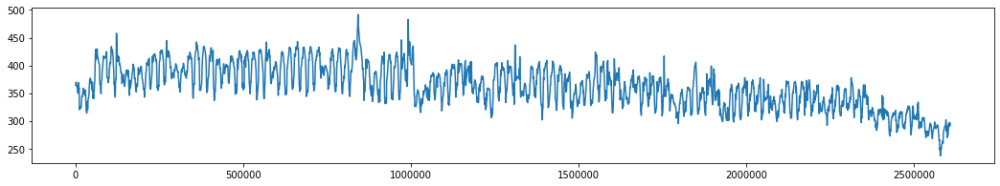

[None, False, None, 0, False, False] 3.6742346141747673
191


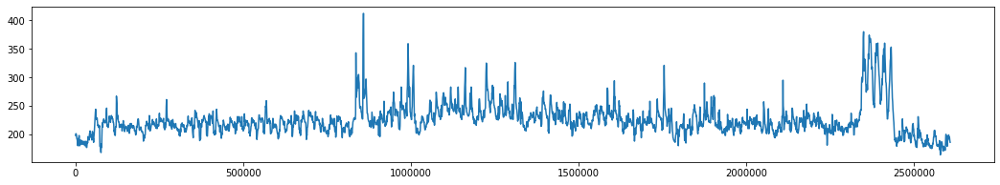

[None, False, 'add', 24, True, False] 3.6201861052163014
192


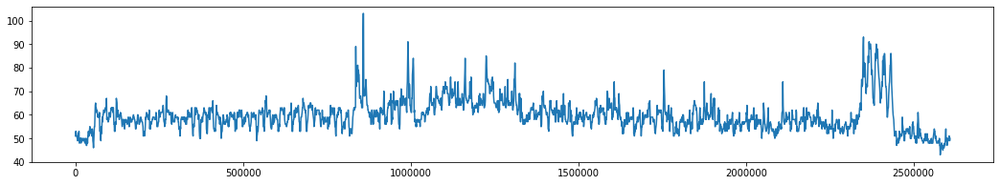

[None, False, 'mul', 24, True, True] 0.8873180264709744
193


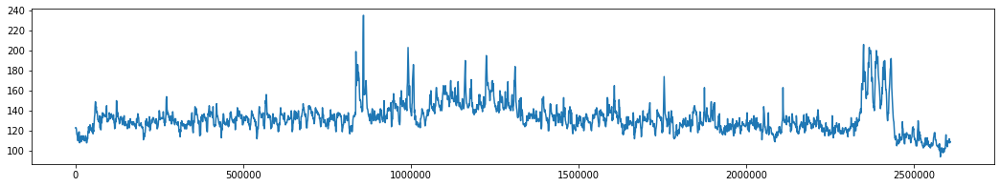

[None, False, 'mul', 24, True, True] 2.038360079646782
194


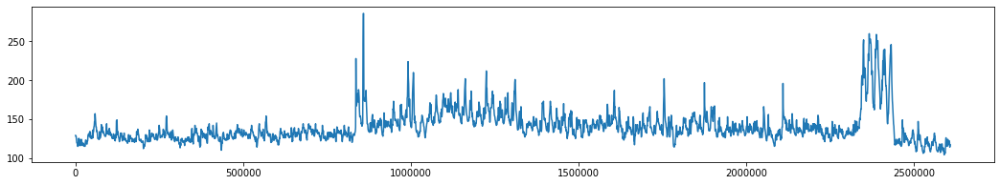

[None, False, 'add', 24, True, True] 4.022281642582726
195


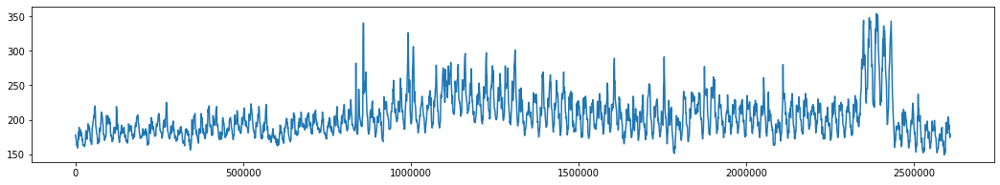

[None, False, 'mul', 24, True, True] 4.67862933929368
196


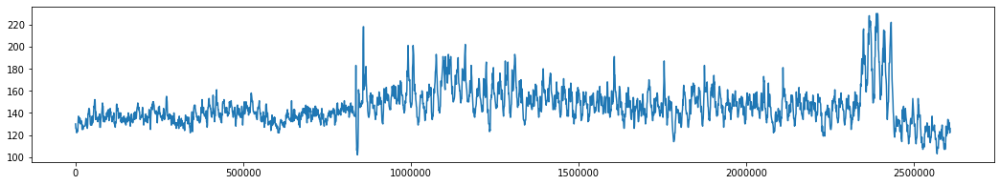

[None, False, 'add', 24, True, True] 3.3832394177767986
197


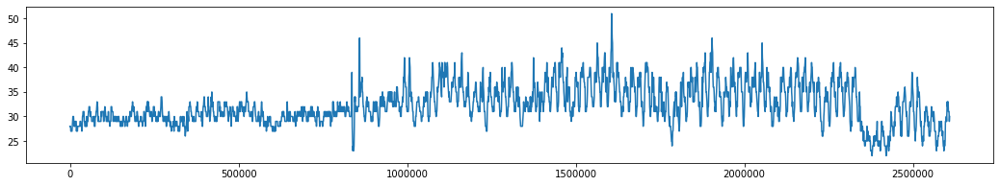

[None, False, 'mul', 24, False, True] 0.9876320582506902
198


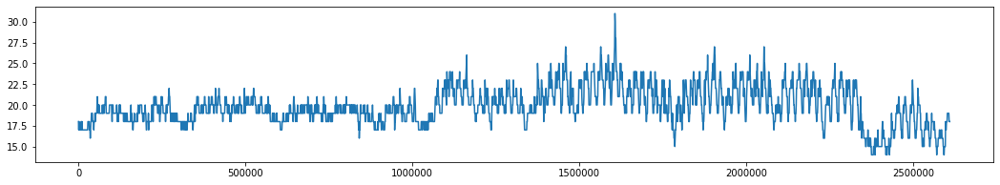

[None, False, 'mul', 24, True, True] 0.2672316654579763
199


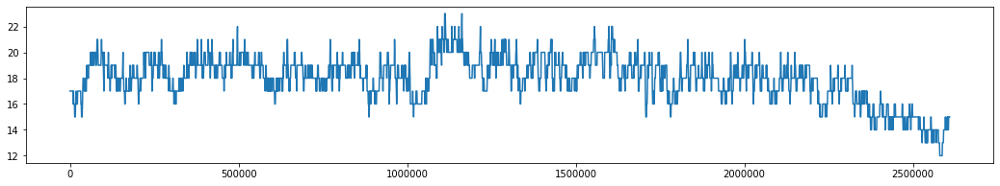

[None, False, 'add', 24, True, False] 0.4221522630875623
200


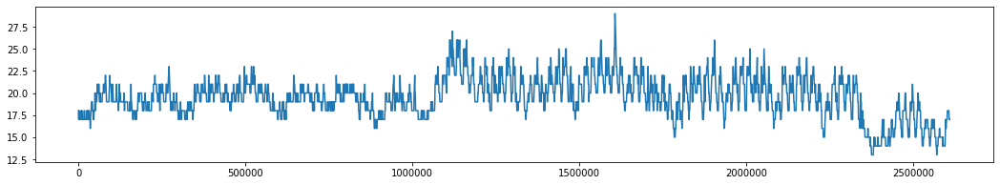

[None, False, 'mul', 24, True, False] 0.37980670152589613
201


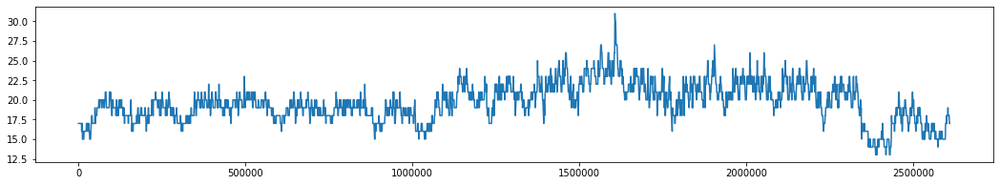

[None, False, 'mul', 24, False, False] 0.43753942670005286
202


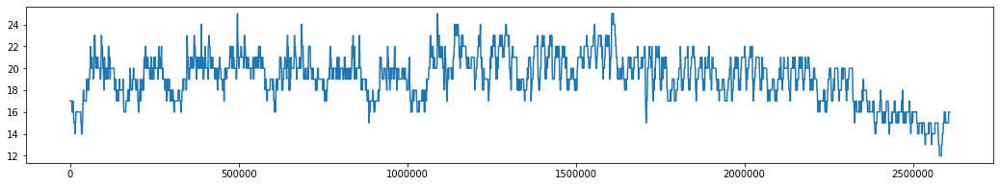

[None, False, 'mul', 24, True, False] 0.44090803990240435
203


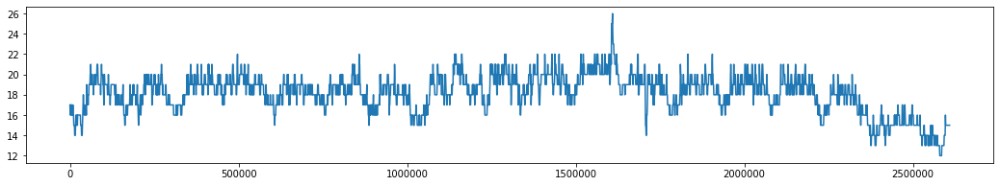

[None, False, None, 0, False, False] 6.658231302335231e-07
204


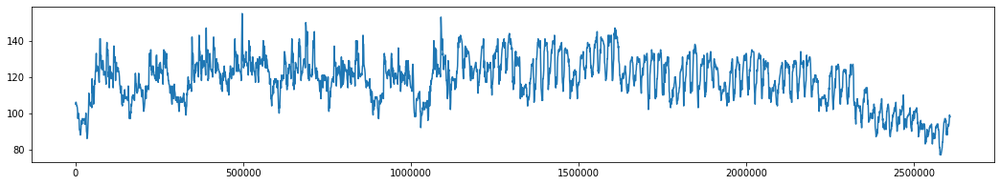

[None, False, 'mul', 24, True, False] 1.4426984361015975
205


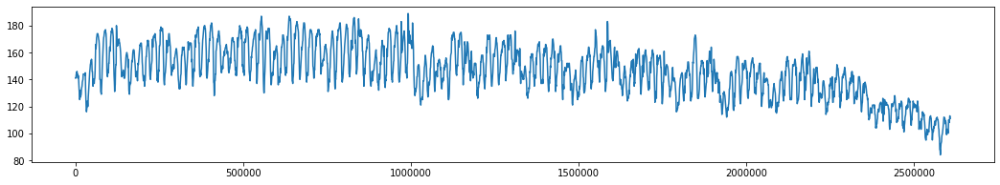

[None, False, 'mul', 24, True, True] 1.8219920986703513
206


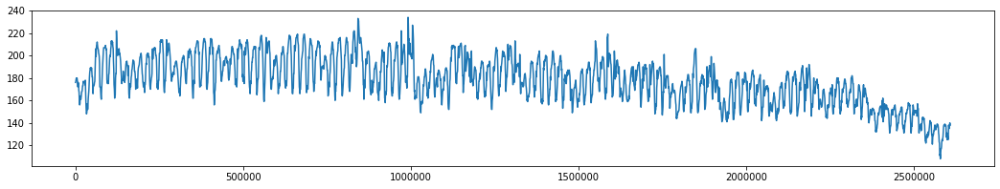

[None, False, None, 0, True, False] 2.1213203435596193
207


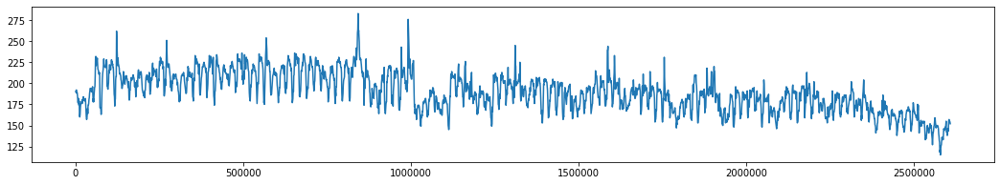

[None, False, None, 0, True, True] 1.4902393936018072
208


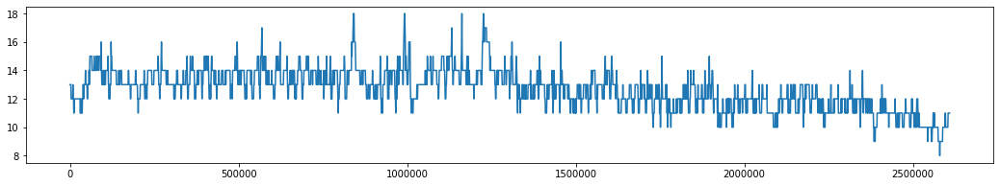

[None, False, None, 0, False, False] 0.037672834805518855
209


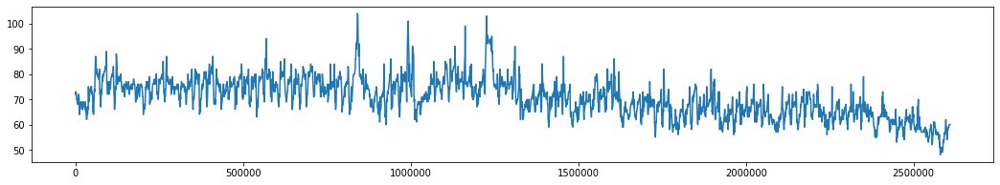

[None, False, None, 0, False, False] 0.511001593807105
210


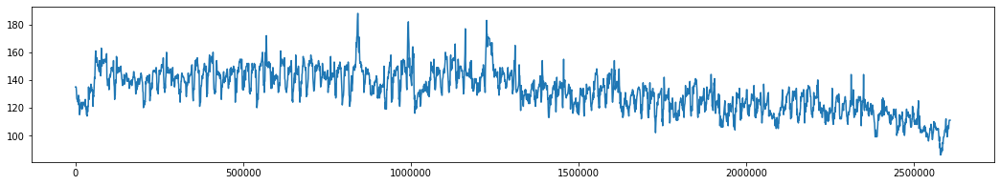

[None, False, None, 0, True, False] 1.187126536702401
211


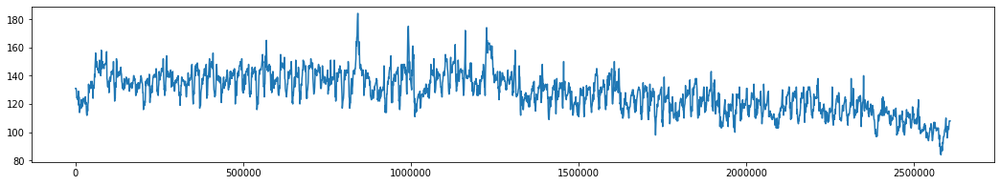

[None, False, None, 0, True, False] 1.6326910309924623
212


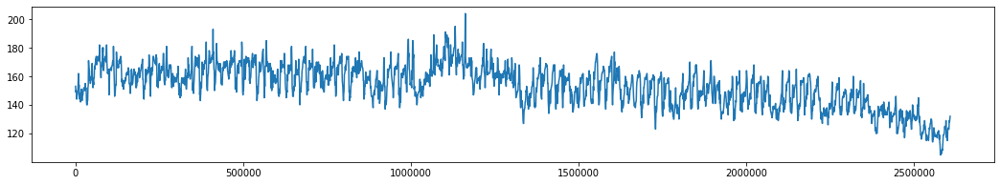

[None, False, 'add', 24, True, False] 1.8437528342663063
213


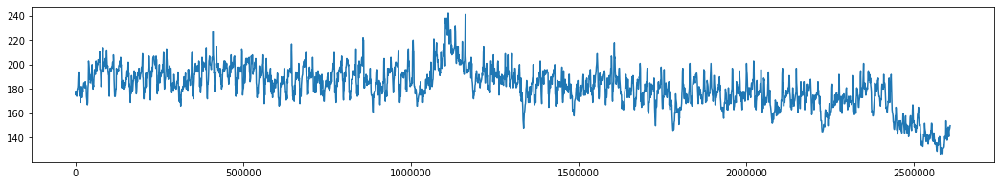

[None, False, None, 0, True, False] 3.4551014800376154
214


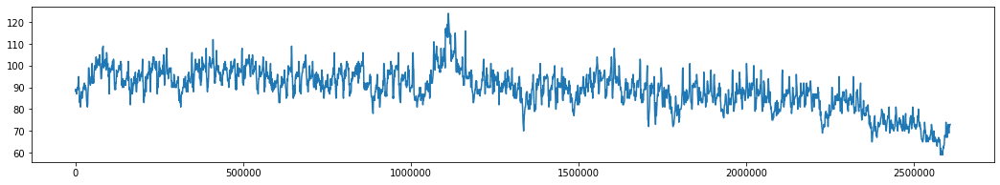

[None, False, 'add', 24, True, False] 1.473845430106757
215


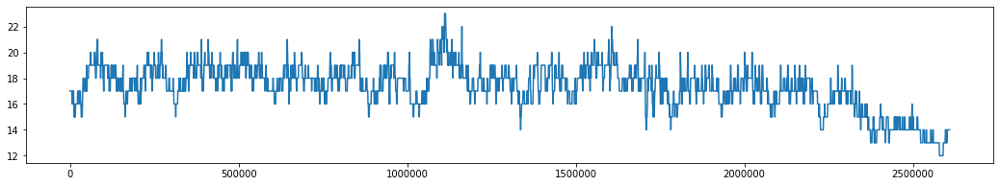

[None, False, None, 0, True, False] 0.0010053952562707157
216


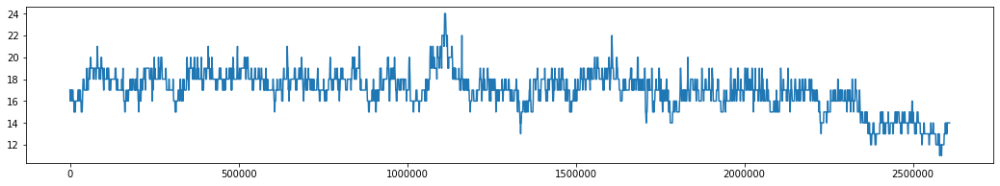

[None, False, None, 0, True, False] 0.00056158041024024
217


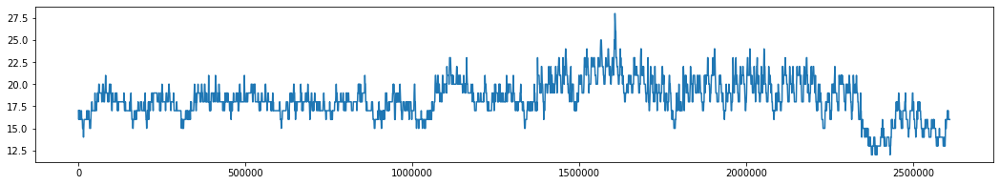

[None, False, None, 0, True, True] 0.08085514829359428
218


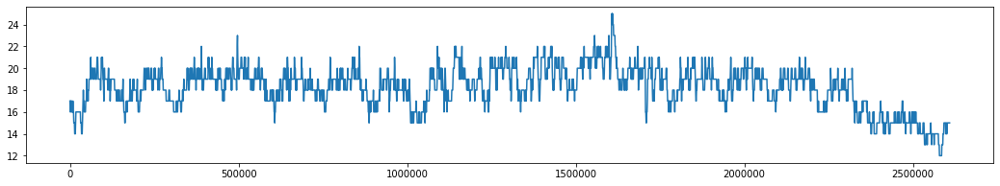

[None, False, None, 0, True, False] 0.0003697838569327702
219


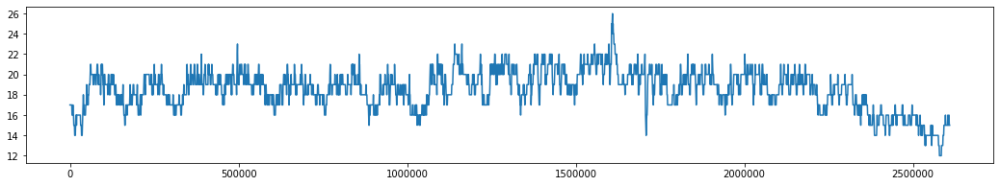

[None, False, 'add', 24, False, True] 0.48906551470152515
220


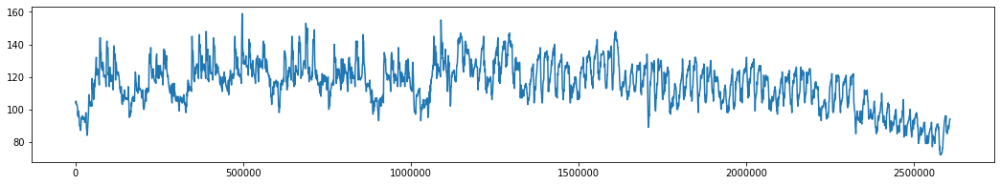

[None, False, 'mul', 24, False, False] 0.9890289575132978
221


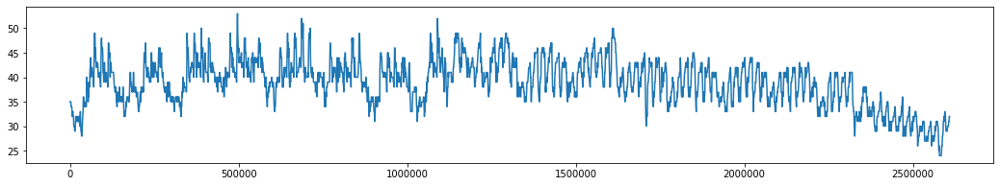

[None, False, 'mul', 24, False, True] 0.48844144726747735


NameError: name 'dict2RMSE' is not defined

In [10]:
dict2Par = {}
data = pd.read_csv('/Users/alket/Desktop/dati/new_data_backfill_forwfill.csv',index_col = 0)
n_test = 4
gbc = data.groupby(by = data['cell_num'])
counter = 0
for index, k_frame in gbc: 
    
    #cell_1 = gbc.get_group('486-1258')
    counter += 1
    print(counter)
    
    cell_num = index
    
    cell_1 = k_frame.iloc[::4, :]
    series1 = cell_1['nr_people']
    
    plt.figure(figsize = (18, 3))
    plt.plot(series1)
    plt.show()
    
    data = pd.DataFrame(series1)
    data = data.values
    
    # model configs
    cfg_list = exp_smoothing_configs(seasonal=[0,24])
    
    # grid search
    scores = grid_search(data, cfg_list, n_test)
   
    # list top 3 configs
    for cfg, error in scores[:1]:
        print(cfg, error)
        cfg_err = str(cfg)+','+str(error)
        dict2Par[cell_num] = cfg_err

with open('Params_data_4_All_Cells_ETS.csv', 'w') as f:
    for key, value in dict2RMSE.items():
        f.write('%s:%s\n' % (key, value))  
        

In [11]:
dict2Par

{'486-1252': "[None, False, 'add', 24, True, True],1.1874046311732764",
 '486-1253': "[None, False, 'add', 24, False, False],0.8779299049946617",
 '486-1254': "[None, False, 'add', 24, False, False],0.9203714136398773",
 '486-1255': "[None, False, 'add', 24, False, False],1.6119735355897111",
 '486-1256': "[None, False, 'add', 24, False, False],1.6284169178871633",
 '486-1257': "[None, False, 'add', 24, False, False],1.3134028413658951",
 '486-1258': "[None, False, 'add', 24, True, True],1.402111086217446",
 '486-1259': "[None, False, 'add', 24, True, False],0.8788958291609537",
 '486-1260': "[None, False, 'add', 24, True, False],1.0577115402118986",
 '486-1261': "[None, False, 'add', 24, True, False],1.0652529848289867",
 '486-1262': "[None, False, 'add', 24, True, False],1.077384615794877",
 '486-1263': "[None, False, 'add', 24, True, False],11.817195059922595",
 '486-1264': "[None, False, 'add', 24, True, False],11.0302745088118",
 '486-1265': "[None, False, 'add', 24, False, False]

In [12]:
with open('Params_data_4_All_Cells_ETS.csv', 'w') as f:
    for key, value in dict2Par.items():
        f.write('%s:%s\n' % (key, value)) 